# Define input folder and input files

In [1]:
import os

# Define the folder path
input_folder = "Input_Folder_Without_Nan"

# Get the list of CSV file names in the folder
input_files = [file for file in os.listdir(input_folder) if file.endswith('.csv')]

# Print the results
print("Input Folder:", input_folder)
print(f"Input Files: {len(input_files)}")
print(input_files)


Input Folder: Input_Folder_Without_Nan
Input Files: 41
['UP002.csv', 'UP003.csv', 'UP004.csv', 'UP008.csv', 'UP009.csv', 'UP012.csv', 'UP014.csv', 'UP016.csv', 'UP017.csv', 'UP018.csv', 'UP019.csv', 'UP020.csv', 'UP021.csv', 'UP022.csv', 'UP023.csv', 'UP024.csv', 'UP025.csv', 'UP026.csv', 'UP028.csv', 'UP029.csv', 'UP030.csv', 'UP031.csv', 'UP032.csv', 'UP033.csv', 'UP034.csv', 'UP035.csv', 'UP036.csv', 'UP037.csv', 'UP038.csv', 'UP039.csv', 'UP040.csv', 'UP041.csv', 'UP042.csv', 'UP043.csv', 'UP044.csv', 'UP046.csv', 'UP048.csv', 'UP049.csv', 'UP050.csv', 'UP051.csv', 'UP052.csv']


# Filling the Nan values with columnwise mean

In [2]:
import pandas as pd
import os

dataframes_dictionary = {}  # Dictionary to store DataFrames
print(input_folder)
for file in input_files:
    file_path = os.path.join(input_folder, file)
    if os.path.exists(file_path):
        # Load the CSV file
        df = pd.read_csv(file_path)
        dataframes_dictionary[file] = df


Input_Folder_Without_Nan


# Create Additional Columns

In [3]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data

from sklearn.preprocessing import LabelEncoder

# Initialize a label encoder
label_encoder = LabelEncoder()

# Load and process the data
dataframes = []
for file_name in input_files:
    df = dataframes_dictionary[file_name]
    
    # Convert 'From Date' to pandas datetime
    df['From Date'] = pd.to_datetime(df['From Date'])
    
    # Split 'From Date' into Year, Month, Day, Hour
    df['Year'] = df['From Date'].dt.year
    df['Month'] = df['From Date'].dt.month
    df['Day'] = df['From Date'].dt.day
    df['Hour'] = df['From Date'].dt.hour
    
    # Drop the original 'From Date' column
    df.drop('From Date', axis=1, inplace=True)

    # Encode the 'Year' column
    df['Year'] = label_encoder.fit_transform(df['Year'])
    
    dataframes.append(df)


# Split the dataset

In [4]:
train_dataframes = []
test_dataframes = []

split_ratio = 0.85  # 85% train, 15% test
train_size = int(len(dataframes[0]) * split_ratio)

for node_idx, df in enumerate(dataframes):
    # Split the dataframe into train and test sets

    train_df = df.iloc[:train_size]
    test_df = df.iloc[train_size:]
    
    # Append the train and test dataframes to the respective lists
    train_dataframes.append(train_df)
    test_dataframes.append(test_df)

print(f"Train dataframes shape: {train_dataframes[0].shape}")
print(f"Test dataframes shape: {test_dataframes[0].shape}")    

Train dataframes shape: (8343, 15)
Test dataframes shape: (1473, 15)


# Scale the dataset

In [5]:
from sklearn.preprocessing import StandardScaler

scalers = {}

feature_scalers = {}

# Apply StandardScaler to all numeric columns except 'Year', 'Month', 'Day', 'Hour'
for node_idx, df in enumerate(train_dataframes):
    numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    columns_to_scale = [col for col in numeric_columns if col not in ['Year', 'Month', 'Day', 'Hour', 'AT (degree C)']]
    
    scaler = StandardScaler()
    df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
    feature_scalers[input_files[node_idx]] = scaler

    scaler1 = StandardScaler()
    df['AT (degree C)'] = scaler1.fit_transform(df[['AT (degree C)']])
    
    # Save the scaler for the target column
    scalers[input_files[node_idx]] = scaler1

# Apply the same scaling to the test dataframes
for node_idx, df in enumerate(test_dataframes):
    scaler = feature_scalers[input_files[node_idx]]
    df[columns_to_scale] = scaler.transform(df[columns_to_scale])
    
    scaler1 = scalers[input_files[node_idx]]
    df['AT (degree C)'] = scaler1.transform(df[['AT (degree C)']])    

C:\Users\Asus\AppData\Local\Temp\ipykernel_1852\250958127.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
C:\Users\Asus\AppData\Local\Temp\ipykernel_1852\250958127.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['AT (degree C)'] = scaler1.fit_transform(df[['AT (degree C)']])
C:\Users\Asus\AppData\Local\Temp\ipykernel_1852\250958127.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


# Create feature and target lists

In [6]:
# Initialize lists to store features and target for each dataframe
train_features_list = []
train_target_list = []

test_features_list = []
test_target_list = []

# Iterate over each dataframe to separate features and target
for node_idx, (df1, df2) in enumerate(zip(train_dataframes, test_dataframes)):
    # Features include all columns except 'AT (degree C)'
    trainfeatures1 = df1.drop(columns=['AT (degree C)'])
    testfeatures1 = df2.drop(columns=['AT (degree C)'])
    
    # Target is the 'AT (degree C)' column
    traintarget1 = df1['AT (degree C)']
    testtarget1 = df2['AT (degree C)']
    
    # Append the features and target to the respective lists
    train_features_list.append(trainfeatures1)
    train_target_list.append(traintarget1)
    test_features_list.append(testfeatures1)
    test_target_list.append(testtarget1)
    
    # Print the columns of features and target, and number of rows
    print(f"DataFrame {node_idx + 1} - {input_files[node_idx]}:")
    print(f"Features columns: {len(trainfeatures1.columns)}")
    print(trainfeatures1.columns)
    
    print("\nTarget column:")
    print(traintarget1.name)
    
    print(f"\nNumber of rows in training features: {trainfeatures1.shape[0]}")
    print(f"Number of rows in training target: {traintarget1.shape[0]}")
    print(f"\nNumber of rows in testing features: {testfeatures1.shape[0]}")
    print(f"Number of rows in testing target: {testtarget1.shape[0]}")
    print("\n" + "="*60 + "\n")

DataFrame 1 - UP002.csv:
Features columns: 14
Index(['PM2.5 (ug/m3)', 'PM10 (ug/m3)', 'NO (ug/m3)', 'NO2 (ug/m3)',
       'SO2 (ug/m3)', 'CO (mg/m3)', 'Ozone (ug/m3)', 'RH (%)', 'WS (m/s)',
       'WD (degree)', 'Year', 'Month', 'Day', 'Hour'],
      dtype='object')

Target column:
AT (degree C)

Number of rows in training features: 8343
Number of rows in training target: 8343

Number of rows in testing features: 1473
Number of rows in testing target: 1473


DataFrame 2 - UP003.csv:
Features columns: 14
Index(['PM2.5 (ug/m3)', 'PM10 (ug/m3)', 'NO (ug/m3)', 'NO2 (ug/m3)',
       'SO2 (ug/m3)', 'CO (mg/m3)', 'Ozone (ug/m3)', 'RH (%)', 'WS (m/s)',
       'WD (degree)', 'Year', 'Month', 'Day', 'Hour'],
      dtype='object')

Target column:
AT (degree C)

Number of rows in training features: 8343
Number of rows in training target: 8343

Number of rows in testing features: 1473
Number of rows in testing target: 1473


DataFrame 3 - UP004.csv:
Features columns: 14
Index(['PM2.5 (ug/m3)', 'PM1

# LSTM Implementation

For Batch Size= 3 and Sequence Length = 3
Processing node 1...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0980
Epoch [2/50], Train Loss: 0.0695
Epoch [3/50], Train Loss: 0.0661
Epoch [4/50], Train Loss: 0.0626
Epoch [5/50], Train Loss: 0.0605
Epoch [6/50], Train Loss: 0.0609
Epoch [7/50], Train Loss: 0.0610
Epoch [8/50], Train Loss: 0.0595
Epoch [9/50], Train Loss: 0.0586
Epoch [10/50], Train Loss: 0.0585
Epoch [11/50], Train Loss: 0.0574
Epoch [12/50], Train Loss: 0.0570
Epoch [13/50], Train Loss: 0.0561
Epoch [14/50], Train Loss: 0.0550
Epoch [15/50], Train Loss: 0.0552
Epoch [16/50], Train Loss: 0.0548
Epoch [17/50], Train Loss: 0.0543
Epoch [18/50], Train Loss: 0.0527
Epoch [19/50], Train Loss: 0.0524
Epoch [20/50], Train Loss: 0.0514
Epoch [21/50], Train Loss: 0.0512
Epoch [22/50], Train Loss: 0.0514
Epoch [23/50], Train Loss: 0.0497
Epoch [24/50], Train Loss: 0.0490
Epoch [25/50], Train Loss: 0.0495
Epoch [26/50], Train Loss: 0.0496
Epoch [27/50], Train Loss: 0.0483
Epoch [28/50], Train Loss: 0.0477
Epoch [29/50], Train Loss: 0.0465
Epoch [30/50], Train Lo

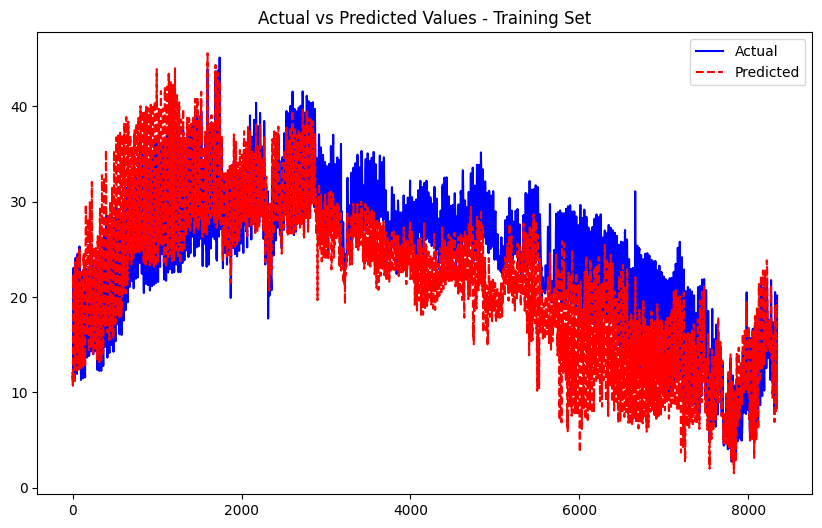

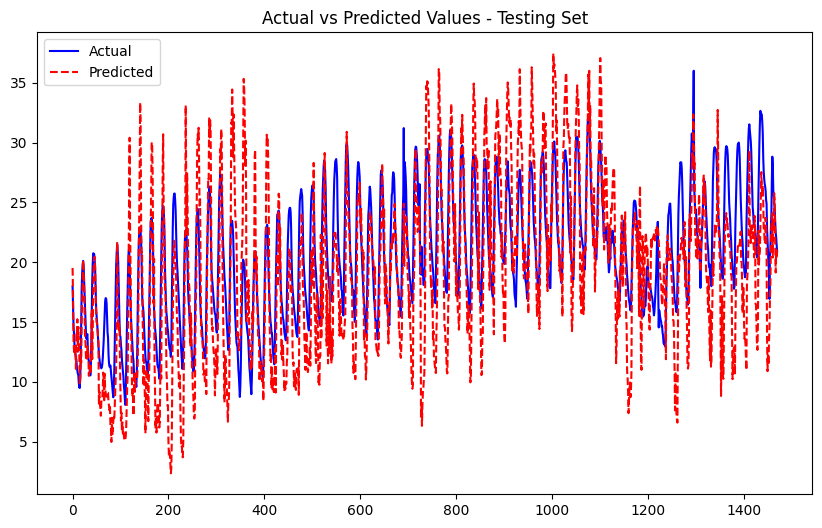

Processing node 2...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0736
Epoch [2/50], Train Loss: 0.0593
Epoch [3/50], Train Loss: 0.0553
Epoch [4/50], Train Loss: 0.0526
Epoch [5/50], Train Loss: 0.0511
Epoch [6/50], Train Loss: 0.0485
Epoch [7/50], Train Loss: 0.0471
Epoch [8/50], Train Loss: 0.0461
Epoch [9/50], Train Loss: 0.0442
Epoch [10/50], Train Loss: 0.0447
Epoch [11/50], Train Loss: 0.0418
Epoch [12/50], Train Loss: 0.0421
Epoch [13/50], Train Loss: 0.0415
Epoch [14/50], Train Loss: 0.0405
Epoch [15/50], Train Loss: 0.0395
Epoch [16/50], Train Loss: 0.0394
Epoch [17/50], Train Loss: 0.0379
Epoch [18/50], Train Loss: 0.0390
Epoch [19/50], Train Loss: 0.0387
Epoch [20/50], Train Loss: 0.0376
Epoch [21/50], Train Loss: 0.0376
Epoch [22/50], Train Loss: 0.0364
Epoch [23/50], Train Loss: 0.0360
Epoch [24/50], Train Loss: 0.0362
Epoch [25/50], Train Loss: 0.0353
Epoch [26/50], Train Loss: 0.0348
Epoch [27/50], Train Loss: 0.0344
Epoch [28/50], Train Loss: 0.0350
Epoch [29/50], Train Loss: 0.0342
Epoch [30/50], Train Lo

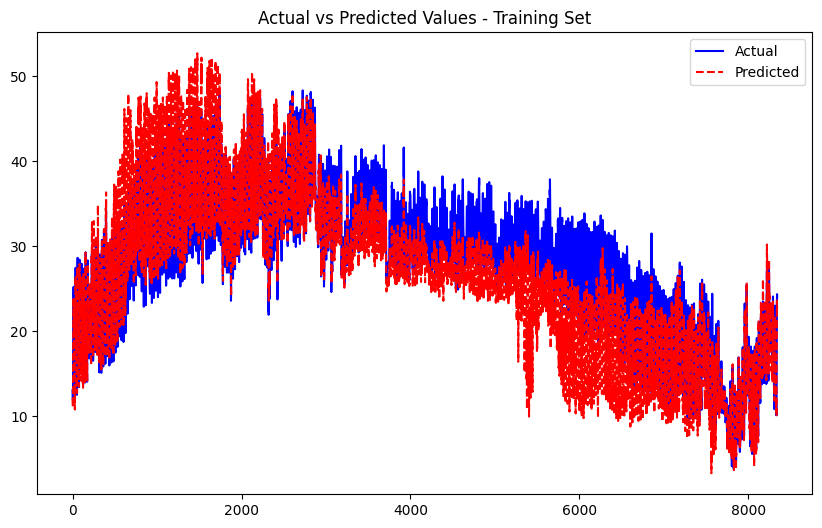

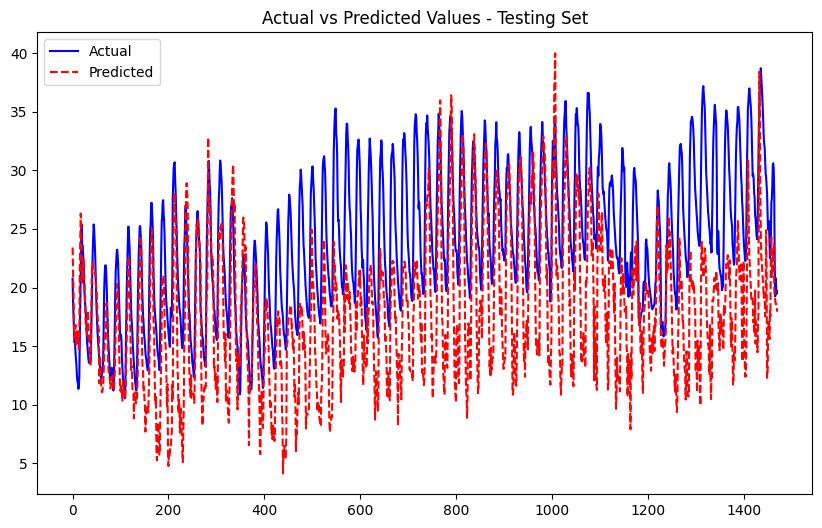

Processing node 3...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0631
Epoch [2/50], Train Loss: 0.0522
Epoch [3/50], Train Loss: 0.0452
Epoch [4/50], Train Loss: 0.0423
Epoch [5/50], Train Loss: 0.0387
Epoch [6/50], Train Loss: 0.0376
Epoch [7/50], Train Loss: 0.0347
Epoch [8/50], Train Loss: 0.0351
Epoch [9/50], Train Loss: 0.0337
Epoch [10/50], Train Loss: 0.0325
Epoch [11/50], Train Loss: 0.0318
Epoch [12/50], Train Loss: 0.0305
Epoch [13/50], Train Loss: 0.0298
Epoch [14/50], Train Loss: 0.0300
Epoch [15/50], Train Loss: 0.0292
Epoch [16/50], Train Loss: 0.0284
Epoch [17/50], Train Loss: 0.0285
Epoch [18/50], Train Loss: 0.0275
Epoch [19/50], Train Loss: 0.0270
Epoch [20/50], Train Loss: 0.0267
Epoch [21/50], Train Loss: 0.0273
Epoch [22/50], Train Loss: 0.0262
Epoch [23/50], Train Loss: 0.0260
Epoch [24/50], Train Loss: 0.0258
Epoch [25/50], Train Loss: 0.0253
Epoch [26/50], Train Loss: 0.0252
Epoch [27/50], Train Loss: 0.0246
Epoch [28/50], Train Loss: 0.0247
Epoch [29/50], Train Loss: 0.0243
Epoch [30/50], Train Lo

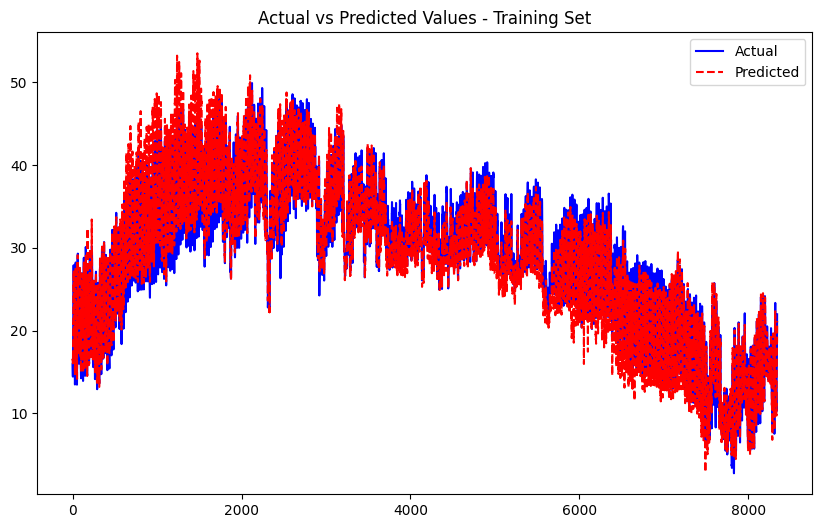

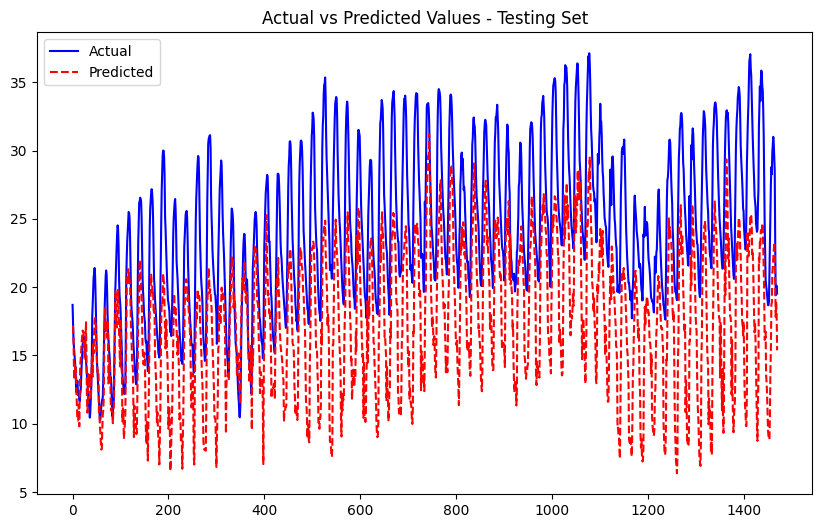

Processing node 4...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.2268
Epoch [2/50], Train Loss: 0.1893
Epoch [3/50], Train Loss: 0.1674
Epoch [4/50], Train Loss: 0.1517
Epoch [5/50], Train Loss: 0.1314
Epoch [6/50], Train Loss: 0.1175
Epoch [7/50], Train Loss: 0.1129
Epoch [8/50], Train Loss: 0.1038
Epoch [9/50], Train Loss: 0.0990
Epoch [10/50], Train Loss: 0.0945
Epoch [11/50], Train Loss: 0.0904
Epoch [12/50], Train Loss: 0.0858
Epoch [13/50], Train Loss: 0.0789
Epoch [14/50], Train Loss: 0.0803
Epoch [15/50], Train Loss: 0.0769
Epoch [16/50], Train Loss: 0.0702
Epoch [17/50], Train Loss: 0.0678
Epoch [18/50], Train Loss: 0.0810
Epoch [19/50], Train Loss: 0.0907
Epoch [20/50], Train Loss: 0.0797
Epoch [21/50], Train Loss: 0.0692
Epoch [22/50], Train Loss: 0.0626
Epoch [23/50], Train Loss: 0.0591
Epoch [24/50], Train Loss: 0.0572
Epoch [25/50], Train Loss: 0.0612
Epoch [26/50], Train Loss: 0.0552
Epoch [27/50], Train Loss: 0.0578
Epoch [28/50], Train Loss: 0.0547
Epoch [29/50], Train Loss: 0.0529
Epoch [30/50], Train Lo

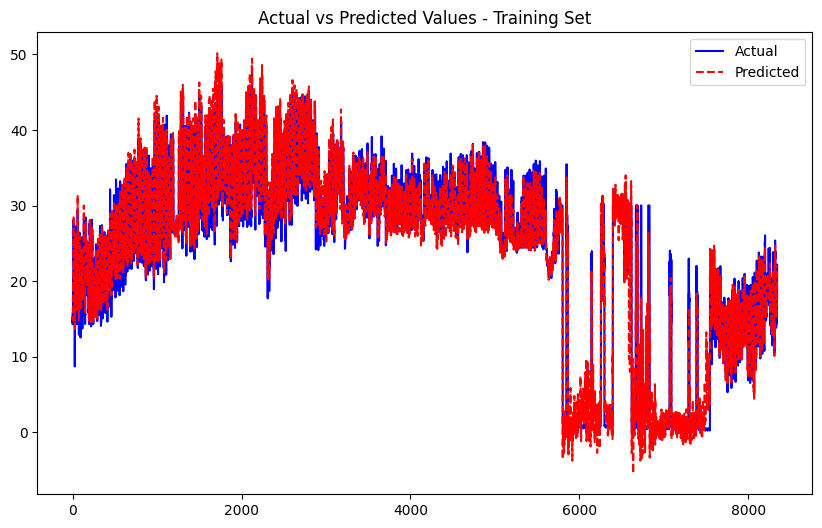

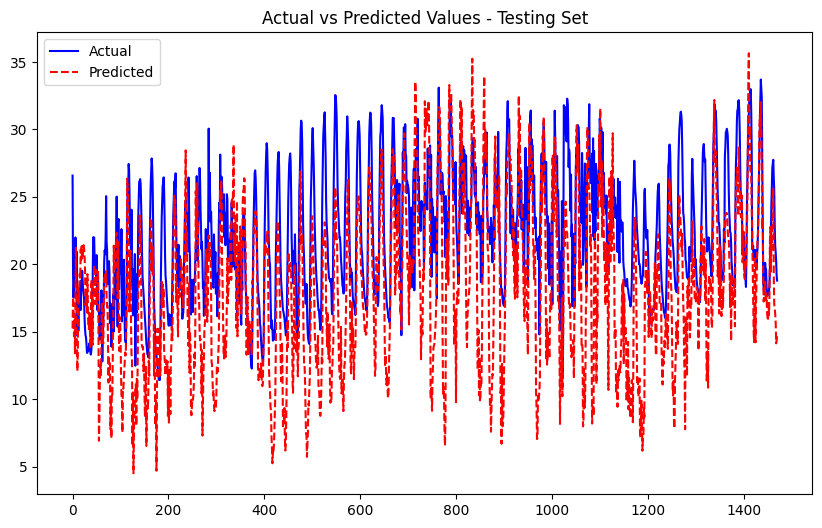

Processing node 5...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0780
Epoch [2/50], Train Loss: 0.0644
Epoch [3/50], Train Loss: 0.0571
Epoch [4/50], Train Loss: 0.0516
Epoch [5/50], Train Loss: 0.0475
Epoch [6/50], Train Loss: 0.0431
Epoch [7/50], Train Loss: 0.0412
Epoch [8/50], Train Loss: 0.0384
Epoch [9/50], Train Loss: 0.0364
Epoch [10/50], Train Loss: 0.0344
Epoch [11/50], Train Loss: 0.0344
Epoch [12/50], Train Loss: 0.0338
Epoch [13/50], Train Loss: 0.0322
Epoch [14/50], Train Loss: 0.0309
Epoch [15/50], Train Loss: 0.0306
Epoch [16/50], Train Loss: 0.0299
Epoch [17/50], Train Loss: 0.0292
Epoch [18/50], Train Loss: 0.0284
Epoch [19/50], Train Loss: 0.0286
Epoch [20/50], Train Loss: 0.0282
Epoch [21/50], Train Loss: 0.0272
Epoch [22/50], Train Loss: 0.0271
Epoch [23/50], Train Loss: 0.0274
Epoch [24/50], Train Loss: 0.0262
Epoch [25/50], Train Loss: 0.0266
Epoch [26/50], Train Loss: 0.0259
Epoch [27/50], Train Loss: 0.0258
Epoch [28/50], Train Loss: 0.0260
Epoch [29/50], Train Loss: 0.0263
Epoch [30/50], Train Lo

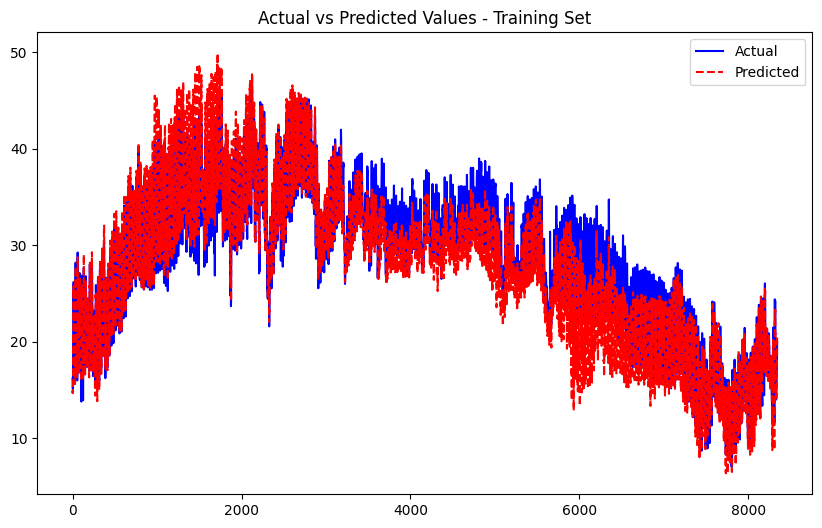

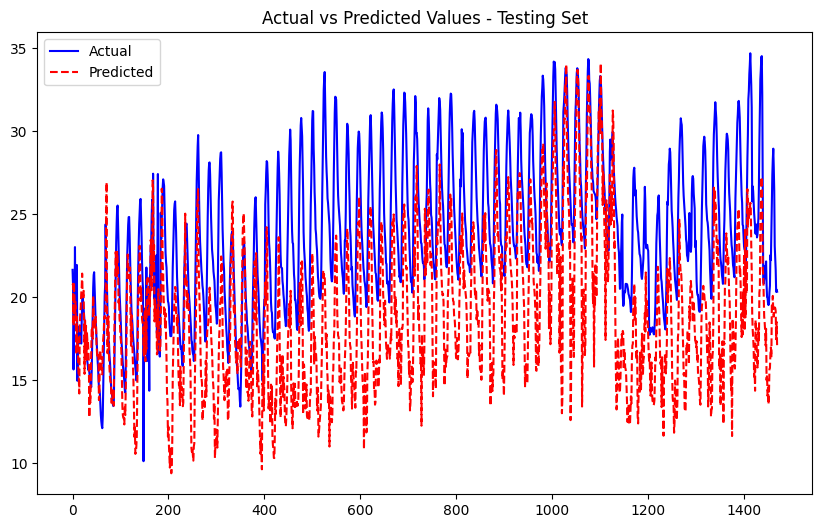

Processing node 6...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0691
Epoch [2/50], Train Loss: 0.0555
Epoch [3/50], Train Loss: 0.0505
Epoch [4/50], Train Loss: 0.0460
Epoch [5/50], Train Loss: 0.0442
Epoch [6/50], Train Loss: 0.0412
Epoch [7/50], Train Loss: 0.0391
Epoch [8/50], Train Loss: 0.0382
Epoch [9/50], Train Loss: 0.0371
Epoch [10/50], Train Loss: 0.0363
Epoch [11/50], Train Loss: 0.0357
Epoch [12/50], Train Loss: 0.0349
Epoch [13/50], Train Loss: 0.0343
Epoch [14/50], Train Loss: 0.0334
Epoch [15/50], Train Loss: 0.0333
Epoch [16/50], Train Loss: 0.0333
Epoch [17/50], Train Loss: 0.0324
Epoch [18/50], Train Loss: 0.0321
Epoch [19/50], Train Loss: 0.0316
Epoch [20/50], Train Loss: 0.0311
Epoch [21/50], Train Loss: 0.0313
Epoch [22/50], Train Loss: 0.0313
Epoch [23/50], Train Loss: 0.0309
Epoch [24/50], Train Loss: 0.0307
Epoch [25/50], Train Loss: 0.0305
Epoch [26/50], Train Loss: 0.0301
Epoch [27/50], Train Loss: 0.0297
Epoch [28/50], Train Loss: 0.0296
Epoch [29/50], Train Loss: 0.0303
Epoch [30/50], Train Lo

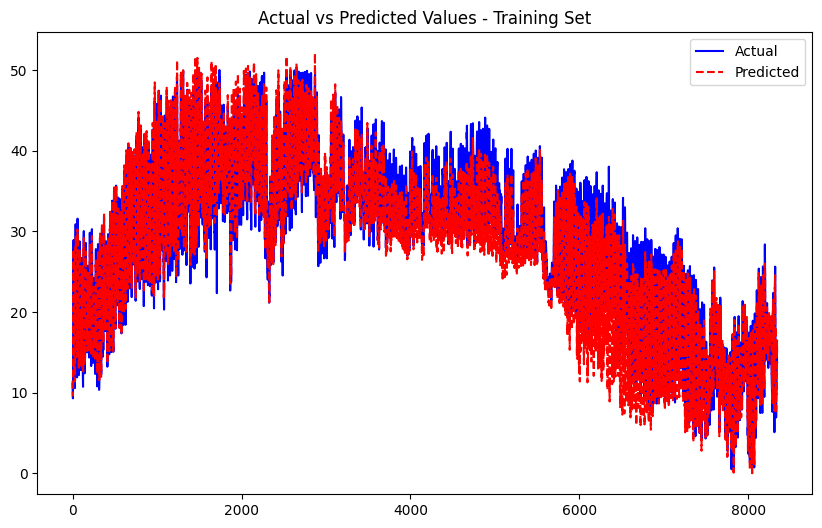

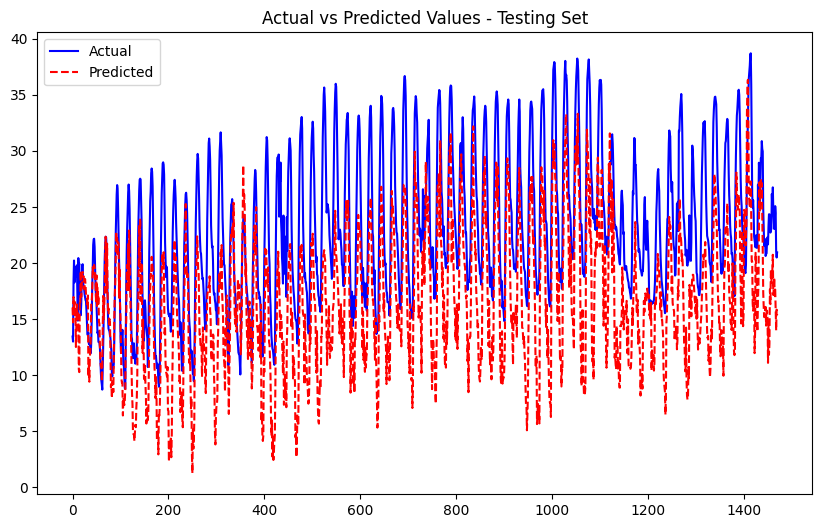

Processing node 7...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0765
Epoch [2/50], Train Loss: 0.0634
Epoch [3/50], Train Loss: 0.0546
Epoch [4/50], Train Loss: 0.0485
Epoch [5/50], Train Loss: 0.0440
Epoch [6/50], Train Loss: 0.0419
Epoch [7/50], Train Loss: 0.0391
Epoch [8/50], Train Loss: 0.0376
Epoch [9/50], Train Loss: 0.0363
Epoch [10/50], Train Loss: 0.0344
Epoch [11/50], Train Loss: 0.0338
Epoch [12/50], Train Loss: 0.0334
Epoch [13/50], Train Loss: 0.0317
Epoch [14/50], Train Loss: 0.0309
Epoch [15/50], Train Loss: 0.0304
Epoch [16/50], Train Loss: 0.0304
Epoch [17/50], Train Loss: 0.0296
Epoch [18/50], Train Loss: 0.0292
Epoch [19/50], Train Loss: 0.0285
Epoch [20/50], Train Loss: 0.0280
Epoch [21/50], Train Loss: 0.0281
Epoch [22/50], Train Loss: 0.0278
Epoch [23/50], Train Loss: 0.0278
Epoch [24/50], Train Loss: 0.0278
Epoch [25/50], Train Loss: 0.0271
Epoch [26/50], Train Loss: 0.0267
Epoch [27/50], Train Loss: 0.0267
Epoch [28/50], Train Loss: 0.0267
Epoch [29/50], Train Loss: 0.0268
Epoch [30/50], Train Lo

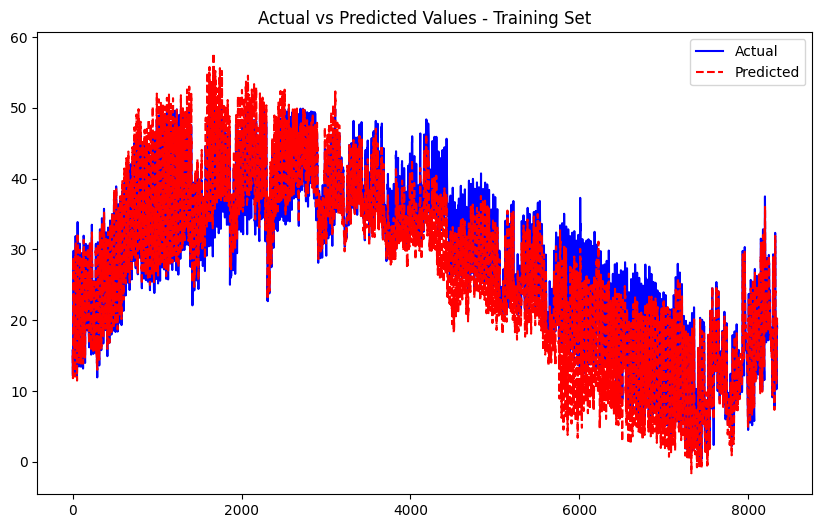

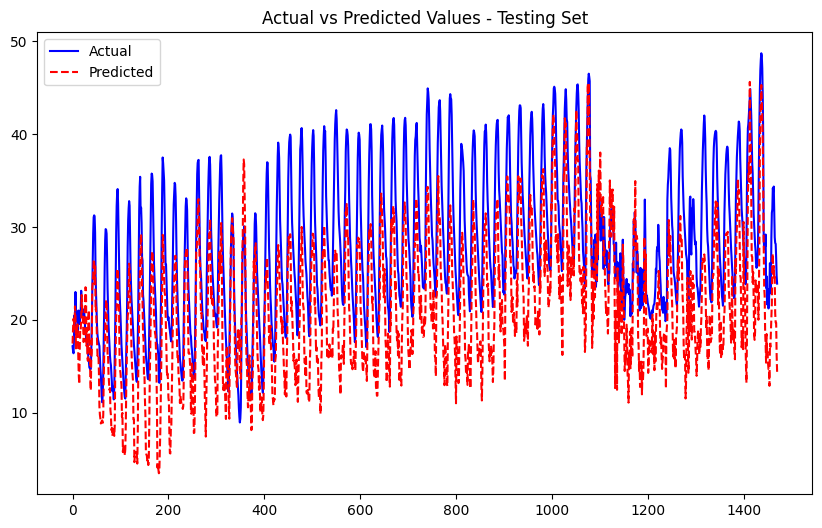

Processing node 8...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0844
Epoch [2/50], Train Loss: 0.0668
Epoch [3/50], Train Loss: 0.0584
Epoch [4/50], Train Loss: 0.0518
Epoch [5/50], Train Loss: 0.0485
Epoch [6/50], Train Loss: 0.0454
Epoch [7/50], Train Loss: 0.0431
Epoch [8/50], Train Loss: 0.0416
Epoch [9/50], Train Loss: 0.0390
Epoch [10/50], Train Loss: 0.0383
Epoch [11/50], Train Loss: 0.0373
Epoch [12/50], Train Loss: 0.0367
Epoch [13/50], Train Loss: 0.0359
Epoch [14/50], Train Loss: 0.0353
Epoch [15/50], Train Loss: 0.0351
Epoch [16/50], Train Loss: 0.0344
Epoch [17/50], Train Loss: 0.0335
Epoch [18/50], Train Loss: 0.0336
Epoch [19/50], Train Loss: 0.0331
Epoch [20/50], Train Loss: 0.0330
Epoch [21/50], Train Loss: 0.0326
Epoch [22/50], Train Loss: 0.0323
Epoch [23/50], Train Loss: 0.0324
Epoch [24/50], Train Loss: 0.0325
Epoch [25/50], Train Loss: 0.0316
Epoch [26/50], Train Loss: 0.0317
Epoch [27/50], Train Loss: 0.0313
Epoch [28/50], Train Loss: 0.0316
Epoch [29/50], Train Loss: 0.0310
Epoch [30/50], Train Lo

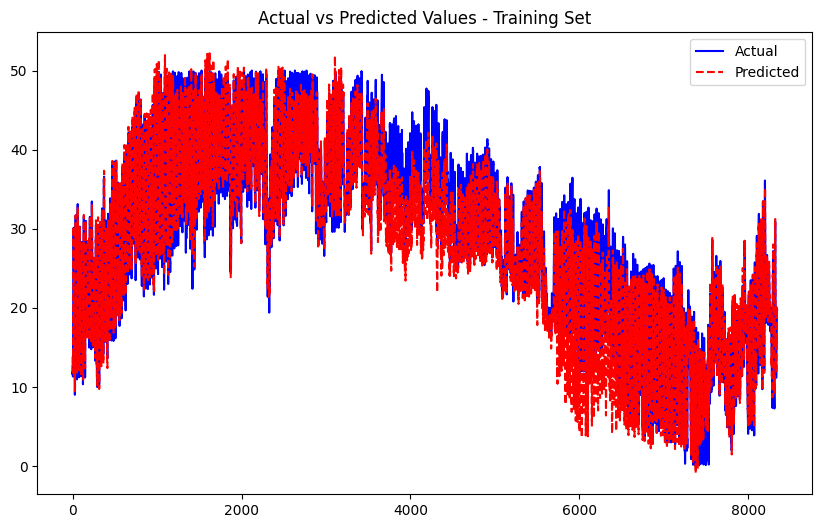

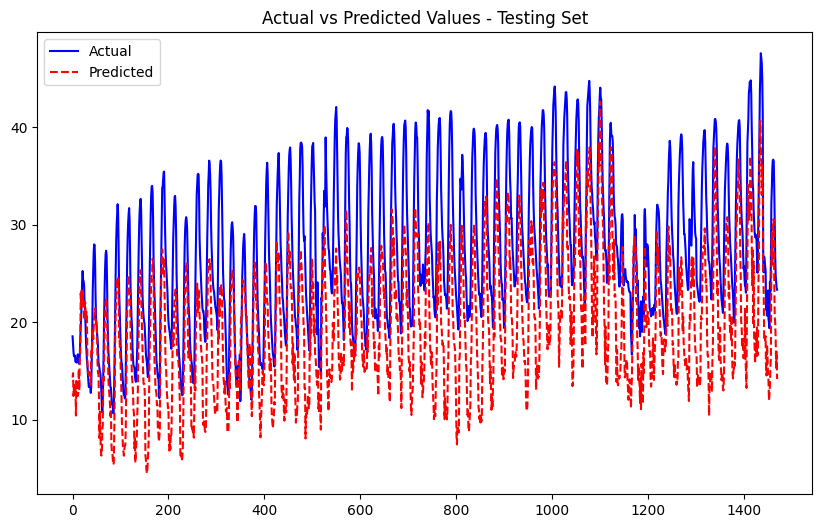

Processing node 9...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0659
Epoch [2/50], Train Loss: 0.0514
Epoch [3/50], Train Loss: 0.0437
Epoch [4/50], Train Loss: 0.0400
Epoch [5/50], Train Loss: 0.0363
Epoch [6/50], Train Loss: 0.0352
Epoch [7/50], Train Loss: 0.0338
Epoch [8/50], Train Loss: 0.0325
Epoch [9/50], Train Loss: 0.0317
Epoch [10/50], Train Loss: 0.0304
Epoch [11/50], Train Loss: 0.0299
Epoch [12/50], Train Loss: 0.0297
Epoch [13/50], Train Loss: 0.0290
Epoch [14/50], Train Loss: 0.0287
Epoch [15/50], Train Loss: 0.0277
Epoch [16/50], Train Loss: 0.0275
Epoch [17/50], Train Loss: 0.0275
Epoch [18/50], Train Loss: 0.0276
Epoch [19/50], Train Loss: 0.0269
Epoch [20/50], Train Loss: 0.0267
Epoch [21/50], Train Loss: 0.0264
Epoch [22/50], Train Loss: 0.0264
Epoch [23/50], Train Loss: 0.0263
Epoch [24/50], Train Loss: 0.0260
Epoch [25/50], Train Loss: 0.0258
Epoch [26/50], Train Loss: 0.0258
Epoch [27/50], Train Loss: 0.0259
Epoch [28/50], Train Loss: 0.0254
Epoch [29/50], Train Loss: 0.0253
Epoch [30/50], Train Lo

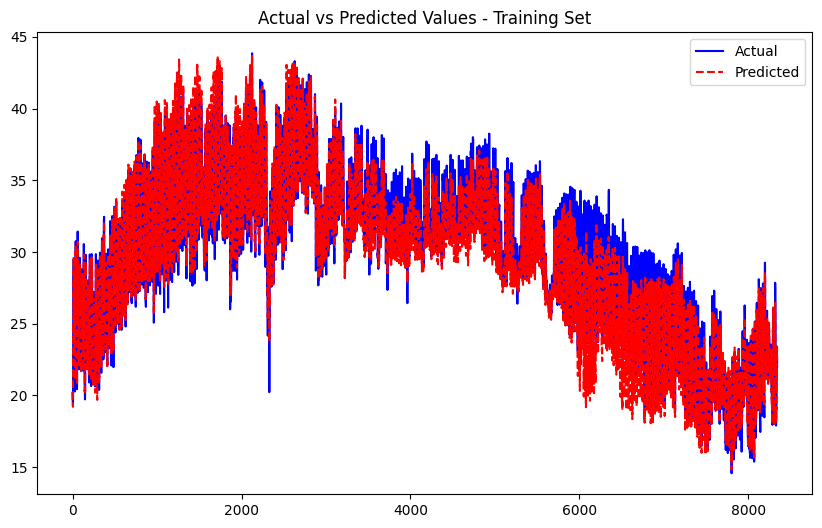

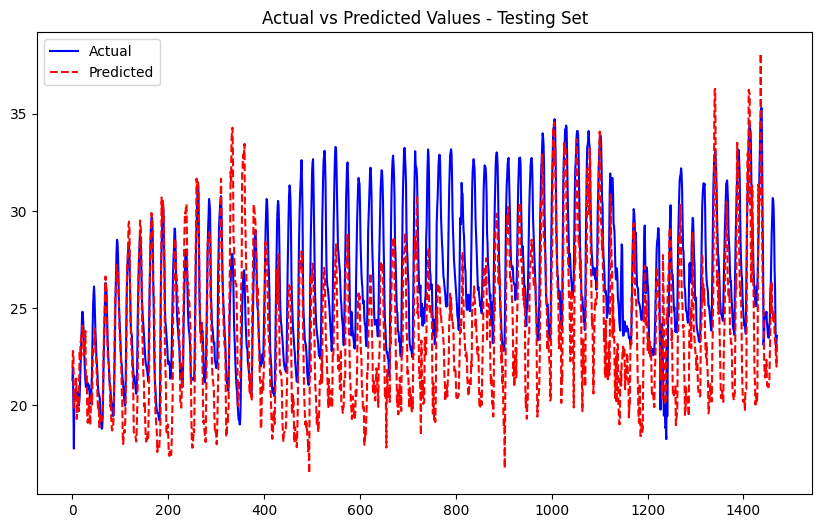

Processing node 10...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.3123
Epoch [2/50], Train Loss: 0.2011
Epoch [3/50], Train Loss: 0.1573
Epoch [4/50], Train Loss: 0.1357
Epoch [5/50], Train Loss: 0.1187
Epoch [6/50], Train Loss: 0.1065
Epoch [7/50], Train Loss: 0.0982
Epoch [8/50], Train Loss: 0.0936
Epoch [9/50], Train Loss: 0.0907
Epoch [10/50], Train Loss: 0.0847
Epoch [11/50], Train Loss: 0.0833
Epoch [12/50], Train Loss: 0.0787
Epoch [13/50], Train Loss: 0.0747
Epoch [14/50], Train Loss: 0.0734
Epoch [15/50], Train Loss: 0.0715
Epoch [16/50], Train Loss: 0.0704
Epoch [17/50], Train Loss: 0.0671
Epoch [18/50], Train Loss: 0.0666
Epoch [19/50], Train Loss: 0.0660
Epoch [20/50], Train Loss: 0.0645
Epoch [21/50], Train Loss: 0.0638
Epoch [22/50], Train Loss: 0.0639
Epoch [23/50], Train Loss: 0.0618
Epoch [24/50], Train Loss: 0.0612
Epoch [25/50], Train Loss: 0.0607
Epoch [26/50], Train Loss: 0.0615
Epoch [27/50], Train Loss: 0.0600
Epoch [28/50], Train Loss: 0.0597
Epoch [29/50], Train Loss: 0.0592
Epoch [30/50], Train Lo

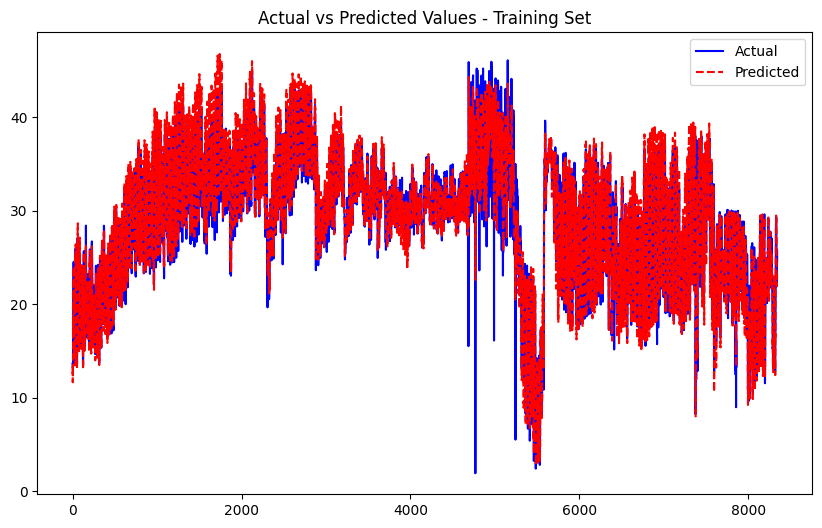

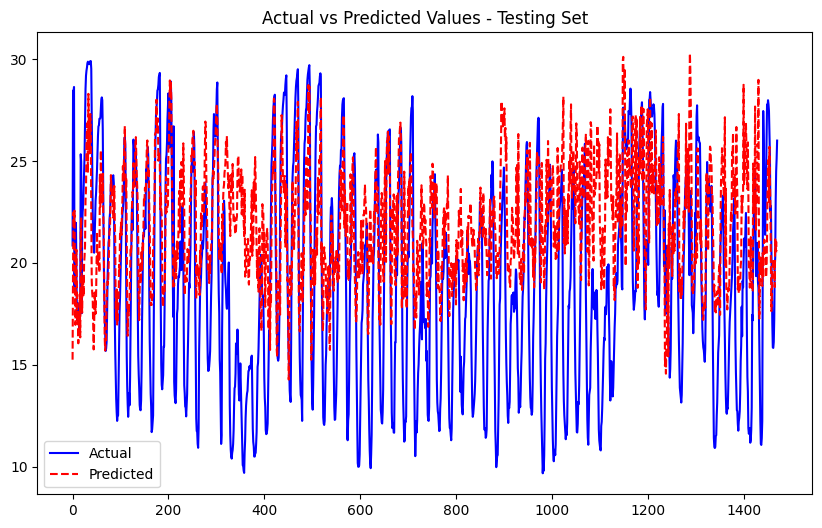

Processing node 11...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0967
Epoch [2/50], Train Loss: 0.0699
Epoch [3/50], Train Loss: 0.0599
Epoch [4/50], Train Loss: 0.0520
Epoch [5/50], Train Loss: 0.0481
Epoch [6/50], Train Loss: 0.0440
Epoch [7/50], Train Loss: 0.0416
Epoch [8/50], Train Loss: 0.0394
Epoch [9/50], Train Loss: 0.0368
Epoch [10/50], Train Loss: 0.0355
Epoch [11/50], Train Loss: 0.0351
Epoch [12/50], Train Loss: 0.0336
Epoch [13/50], Train Loss: 0.0335
Epoch [14/50], Train Loss: 0.0329
Epoch [15/50], Train Loss: 0.0330
Epoch [16/50], Train Loss: 0.0315
Epoch [17/50], Train Loss: 0.0315
Epoch [18/50], Train Loss: 0.0309
Epoch [19/50], Train Loss: 0.0306
Epoch [20/50], Train Loss: 0.0298
Epoch [21/50], Train Loss: 0.0298
Epoch [22/50], Train Loss: 0.0296
Epoch [23/50], Train Loss: 0.0293
Epoch [24/50], Train Loss: 0.0289
Epoch [25/50], Train Loss: 0.0288
Epoch [26/50], Train Loss: 0.0284
Epoch [27/50], Train Loss: 0.0288
Epoch [28/50], Train Loss: 0.0284
Epoch [29/50], Train Loss: 0.0282
Epoch [30/50], Train Lo

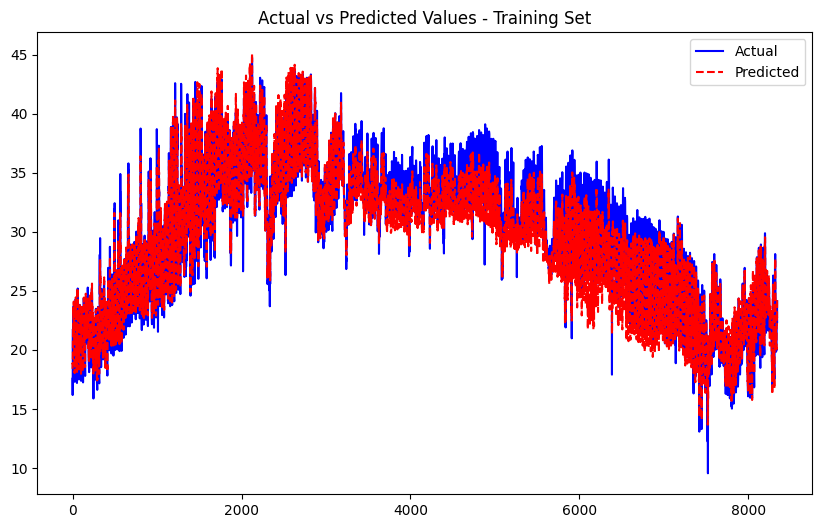

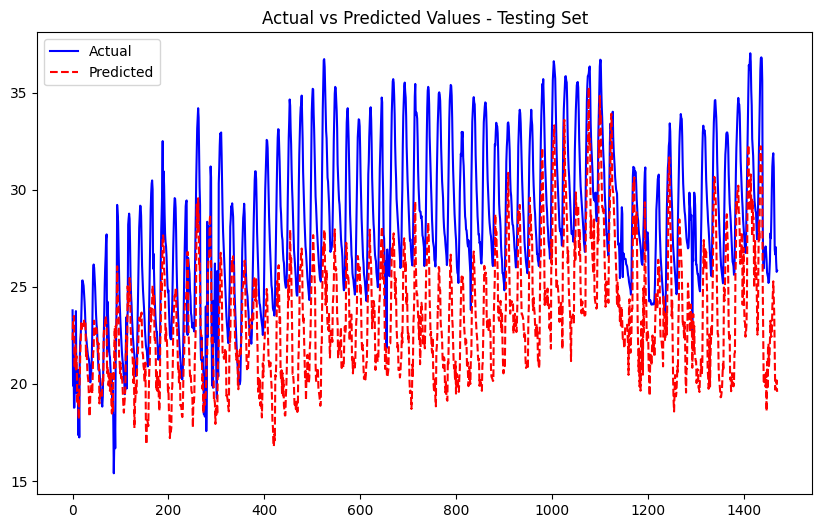

Processing node 12...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0569
Epoch [2/50], Train Loss: 0.0460
Epoch [3/50], Train Loss: 0.0384
Epoch [4/50], Train Loss: 0.0341
Epoch [5/50], Train Loss: 0.0311
Epoch [6/50], Train Loss: 0.0294
Epoch [7/50], Train Loss: 0.0278
Epoch [8/50], Train Loss: 0.0262
Epoch [9/50], Train Loss: 0.0259
Epoch [10/50], Train Loss: 0.0250
Epoch [11/50], Train Loss: 0.0249
Epoch [12/50], Train Loss: 0.0241
Epoch [13/50], Train Loss: 0.0231
Epoch [14/50], Train Loss: 0.0226
Epoch [15/50], Train Loss: 0.0225
Epoch [16/50], Train Loss: 0.0220
Epoch [17/50], Train Loss: 0.0224
Epoch [18/50], Train Loss: 0.0223
Epoch [19/50], Train Loss: 0.0218
Epoch [20/50], Train Loss: 0.0214
Epoch [21/50], Train Loss: 0.0218
Epoch [22/50], Train Loss: 0.0213
Epoch [23/50], Train Loss: 0.0211
Epoch [24/50], Train Loss: 0.0211
Epoch [25/50], Train Loss: 0.0212
Epoch [26/50], Train Loss: 0.0209
Epoch [27/50], Train Loss: 0.0208
Epoch [28/50], Train Loss: 0.0211
Epoch [29/50], Train Loss: 0.0208
Epoch [30/50], Train Lo

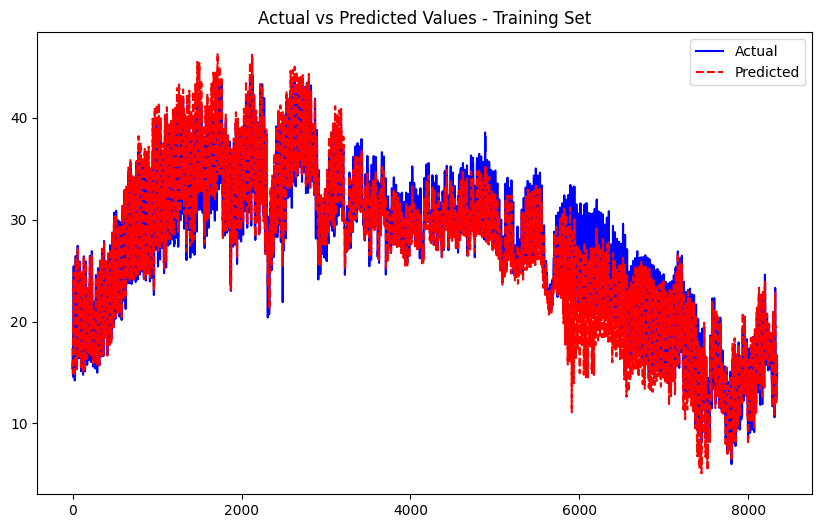

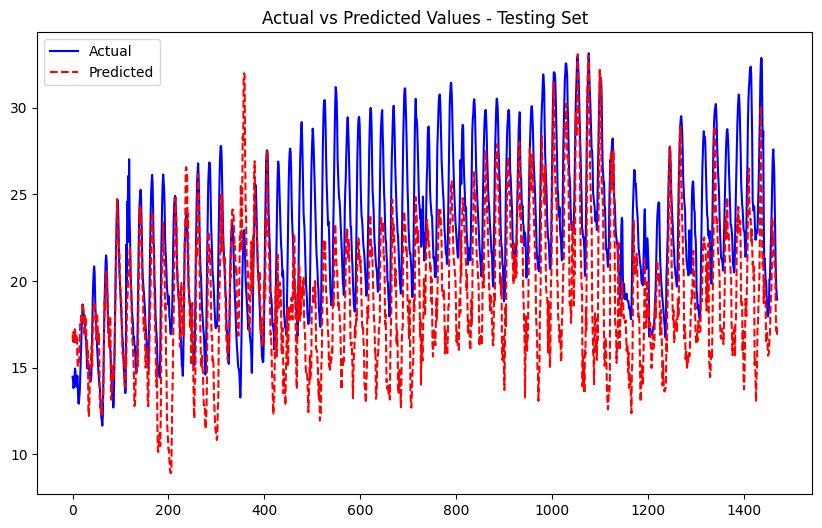

Processing node 13...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.1249
Epoch [2/50], Train Loss: 0.1035
Epoch [3/50], Train Loss: 0.0884
Epoch [4/50], Train Loss: 0.0764
Epoch [5/50], Train Loss: 0.0659
Epoch [6/50], Train Loss: 0.0570
Epoch [7/50], Train Loss: 0.0518
Epoch [8/50], Train Loss: 0.0461
Epoch [9/50], Train Loss: 0.0425
Epoch [10/50], Train Loss: 0.0400
Epoch [11/50], Train Loss: 0.0366
Epoch [12/50], Train Loss: 0.0351
Epoch [13/50], Train Loss: 0.0329
Epoch [14/50], Train Loss: 0.0310
Epoch [15/50], Train Loss: 0.0304
Epoch [16/50], Train Loss: 0.0294
Epoch [17/50], Train Loss: 0.0279
Epoch [18/50], Train Loss: 0.0290
Epoch [19/50], Train Loss: 0.0269
Epoch [20/50], Train Loss: 0.0268
Epoch [21/50], Train Loss: 0.0261
Epoch [22/50], Train Loss: 0.0258
Epoch [23/50], Train Loss: 0.0246
Epoch [24/50], Train Loss: 0.0245
Epoch [25/50], Train Loss: 0.0245
Epoch [26/50], Train Loss: 0.0239
Epoch [27/50], Train Loss: 0.0231
Epoch [28/50], Train Loss: 0.0233
Epoch [29/50], Train Loss: 0.0234
Epoch [30/50], Train Lo

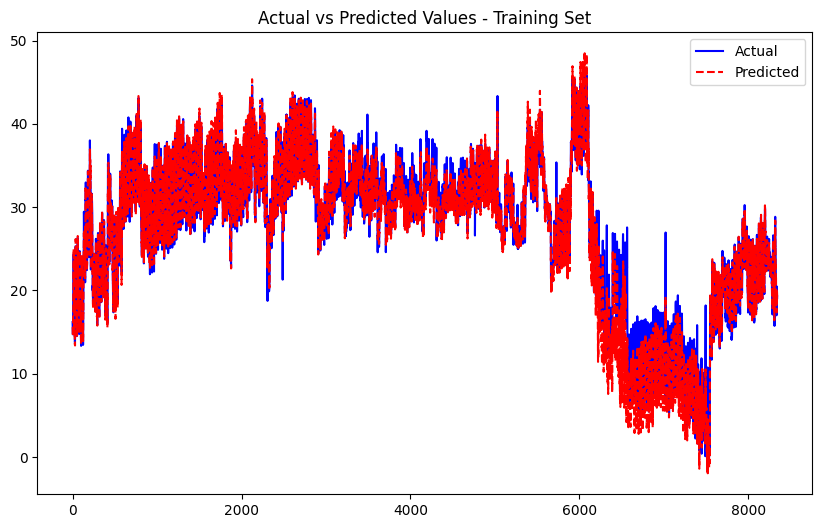

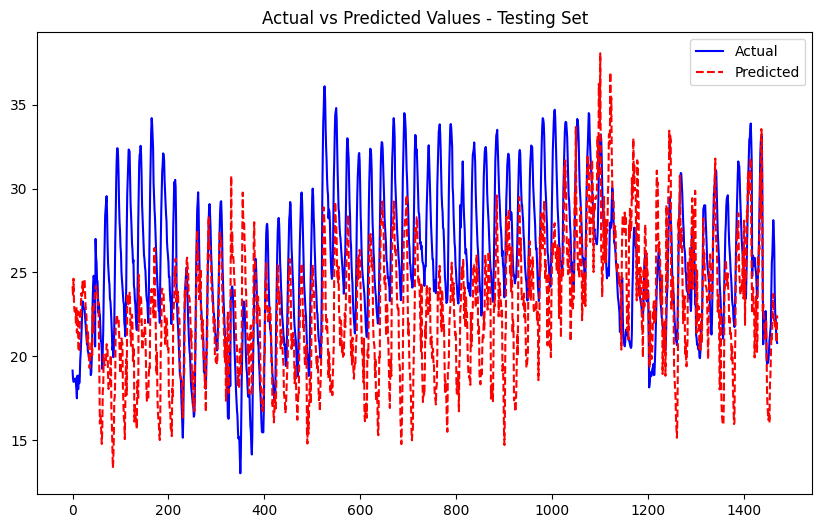

Processing node 14...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0807
Epoch [2/50], Train Loss: 0.0659
Epoch [3/50], Train Loss: 0.0547
Epoch [4/50], Train Loss: 0.0491
Epoch [5/50], Train Loss: 0.0446
Epoch [6/50], Train Loss: 0.0411
Epoch [7/50], Train Loss: 0.0389
Epoch [8/50], Train Loss: 0.0378
Epoch [9/50], Train Loss: 0.0363
Epoch [10/50], Train Loss: 0.0350
Epoch [11/50], Train Loss: 0.0344
Epoch [12/50], Train Loss: 0.0339
Epoch [13/50], Train Loss: 0.0334
Epoch [14/50], Train Loss: 0.0328
Epoch [15/50], Train Loss: 0.0326
Epoch [16/50], Train Loss: 0.0317
Epoch [17/50], Train Loss: 0.0311
Epoch [18/50], Train Loss: 0.0316
Epoch [19/50], Train Loss: 0.0312
Epoch [20/50], Train Loss: 0.0302
Epoch [21/50], Train Loss: 0.0303
Epoch [22/50], Train Loss: 0.0304
Epoch [23/50], Train Loss: 0.0300
Epoch [24/50], Train Loss: 0.0300
Epoch [25/50], Train Loss: 0.0300
Epoch [26/50], Train Loss: 0.0302
Epoch [27/50], Train Loss: 0.0300
Epoch [28/50], Train Loss: 0.0295
Epoch [29/50], Train Loss: 0.0290
Epoch [30/50], Train Lo

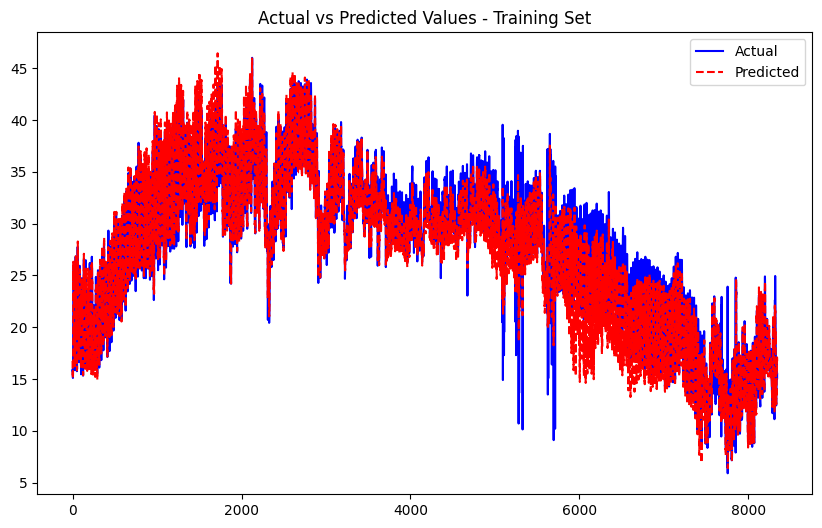

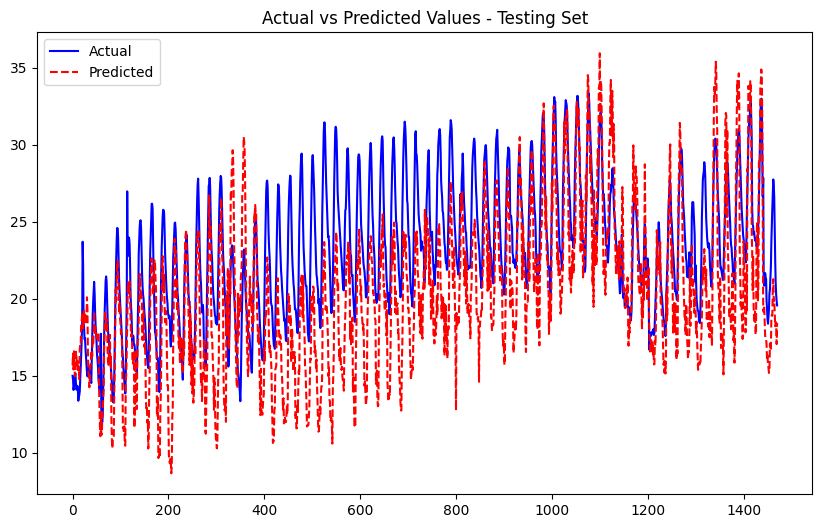

Processing node 15...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0789
Epoch [2/50], Train Loss: 0.0685
Epoch [3/50], Train Loss: 0.0606
Epoch [4/50], Train Loss: 0.0556
Epoch [5/50], Train Loss: 0.0520
Epoch [6/50], Train Loss: 0.0500
Epoch [7/50], Train Loss: 0.0483
Epoch [8/50], Train Loss: 0.0461
Epoch [9/50], Train Loss: 0.0450
Epoch [10/50], Train Loss: 0.0441
Epoch [11/50], Train Loss: 0.0430
Epoch [12/50], Train Loss: 0.0428
Epoch [13/50], Train Loss: 0.0423
Epoch [14/50], Train Loss: 0.0414
Epoch [15/50], Train Loss: 0.0411
Epoch [16/50], Train Loss: 0.0408
Epoch [17/50], Train Loss: 0.0399
Epoch [18/50], Train Loss: 0.0405
Epoch [19/50], Train Loss: 0.0396
Epoch [20/50], Train Loss: 0.0397
Epoch [21/50], Train Loss: 0.0398
Epoch [22/50], Train Loss: 0.0396
Epoch [23/50], Train Loss: 0.0390
Epoch [24/50], Train Loss: 0.0392
Epoch [25/50], Train Loss: 0.0394
Epoch [26/50], Train Loss: 0.0391
Epoch [27/50], Train Loss: 0.0391
Epoch [28/50], Train Loss: 0.0388
Epoch [29/50], Train Loss: 0.0387
Epoch [30/50], Train Lo

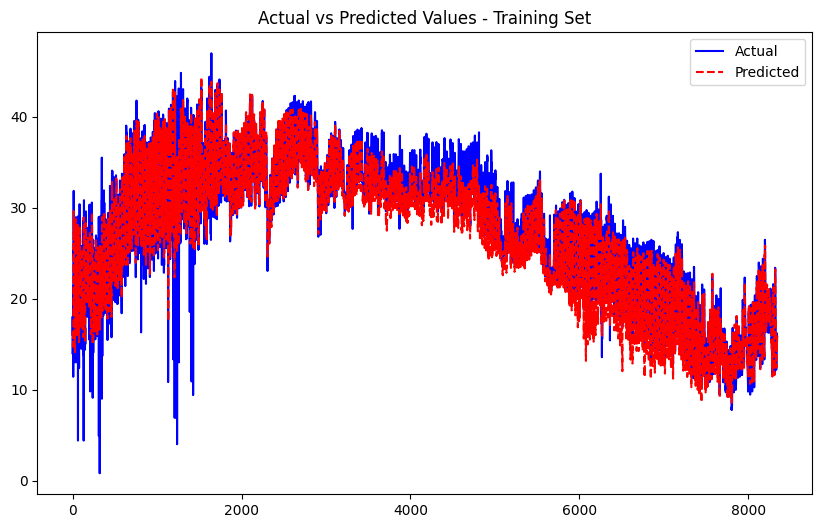

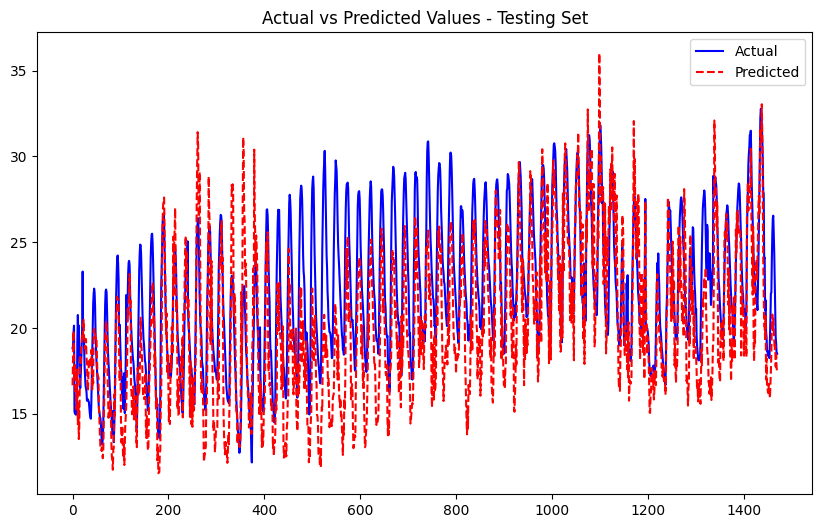

Processing node 16...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.1357
Epoch [2/50], Train Loss: 0.1146
Epoch [3/50], Train Loss: 0.1021
Epoch [4/50], Train Loss: 0.0965
Epoch [5/50], Train Loss: 0.0839
Epoch [6/50], Train Loss: 0.0772
Epoch [7/50], Train Loss: 0.0726
Epoch [8/50], Train Loss: 0.0673
Epoch [9/50], Train Loss: 0.0596
Epoch [10/50], Train Loss: 0.0566
Epoch [11/50], Train Loss: 0.0514
Epoch [12/50], Train Loss: 0.0483
Epoch [13/50], Train Loss: 0.0432
Epoch [14/50], Train Loss: 0.0422
Epoch [15/50], Train Loss: 0.0408
Epoch [16/50], Train Loss: 0.0413
Epoch [17/50], Train Loss: 0.0389
Epoch [18/50], Train Loss: 0.0355
Epoch [19/50], Train Loss: 0.0364
Epoch [20/50], Train Loss: 0.0357
Epoch [21/50], Train Loss: 0.0359
Epoch [22/50], Train Loss: 0.0349
Epoch [23/50], Train Loss: 0.0318
Epoch [24/50], Train Loss: 0.0313
Epoch [25/50], Train Loss: 0.0305
Epoch [26/50], Train Loss: 0.0297
Epoch [27/50], Train Loss: 0.0284
Epoch [28/50], Train Loss: 0.0289
Epoch [29/50], Train Loss: 0.0258
Epoch [30/50], Train Lo

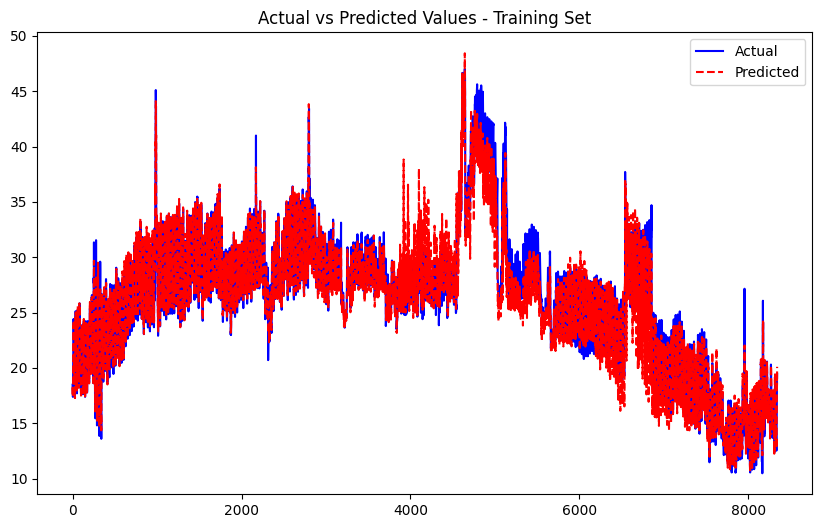

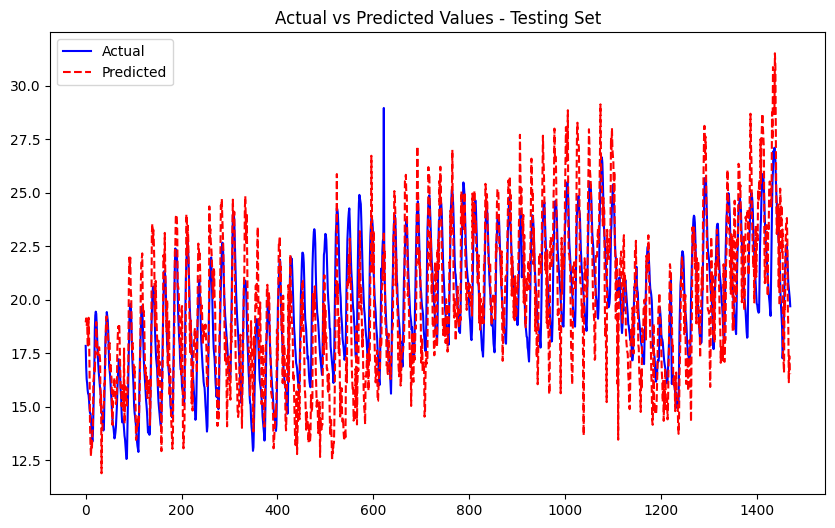

Processing node 17...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0951
Epoch [2/50], Train Loss: 0.0747
Epoch [3/50], Train Loss: 0.0655
Epoch [4/50], Train Loss: 0.0545
Epoch [5/50], Train Loss: 0.0498
Epoch [6/50], Train Loss: 0.0462
Epoch [7/50], Train Loss: 0.0429
Epoch [8/50], Train Loss: 0.0399
Epoch [9/50], Train Loss: 0.0375
Epoch [10/50], Train Loss: 0.0368
Epoch [11/50], Train Loss: 0.0358
Epoch [12/50], Train Loss: 0.0345
Epoch [13/50], Train Loss: 0.0332
Epoch [14/50], Train Loss: 0.0324
Epoch [15/50], Train Loss: 0.0317
Epoch [16/50], Train Loss: 0.0320
Epoch [17/50], Train Loss: 0.0306
Epoch [18/50], Train Loss: 0.0301
Epoch [19/50], Train Loss: 0.0295
Epoch [20/50], Train Loss: 0.0294
Epoch [21/50], Train Loss: 0.0291
Epoch [22/50], Train Loss: 0.0280
Epoch [23/50], Train Loss: 0.0284
Epoch [24/50], Train Loss: 0.0279
Epoch [25/50], Train Loss: 0.0274
Epoch [26/50], Train Loss: 0.0272
Epoch [27/50], Train Loss: 0.0274
Epoch [28/50], Train Loss: 0.0270
Epoch [29/50], Train Loss: 0.0270
Epoch [30/50], Train Lo

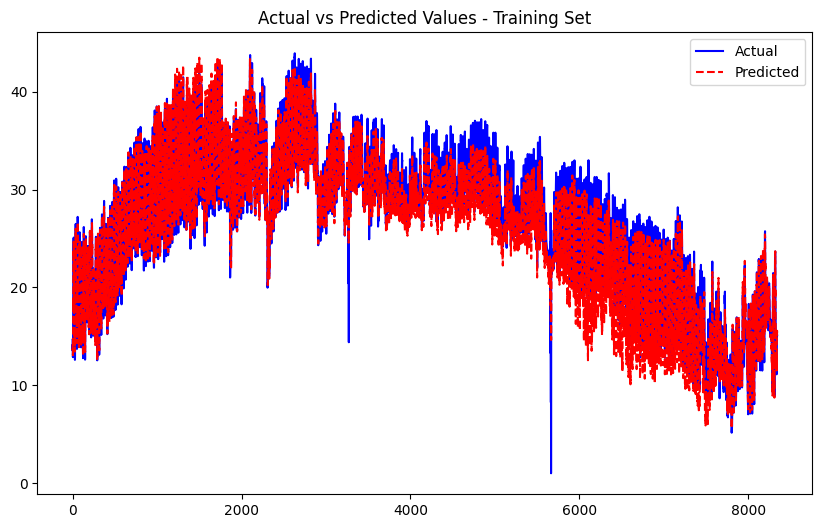

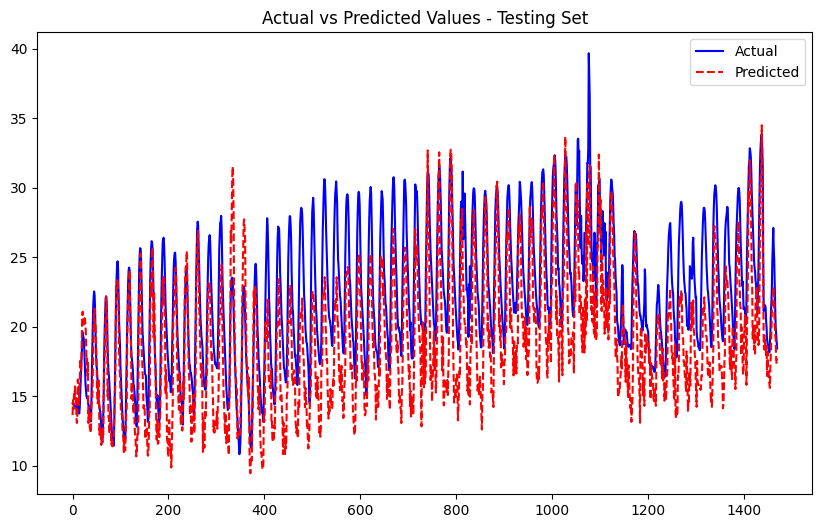

Processing node 18...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0529
Epoch [2/50], Train Loss: 0.0437
Epoch [3/50], Train Loss: 0.0377
Epoch [4/50], Train Loss: 0.0348
Epoch [5/50], Train Loss: 0.0326
Epoch [6/50], Train Loss: 0.0305
Epoch [7/50], Train Loss: 0.0295
Epoch [8/50], Train Loss: 0.0286
Epoch [9/50], Train Loss: 0.0282
Epoch [10/50], Train Loss: 0.0271
Epoch [11/50], Train Loss: 0.0267
Epoch [12/50], Train Loss: 0.0263
Epoch [13/50], Train Loss: 0.0256
Epoch [14/50], Train Loss: 0.0245
Epoch [15/50], Train Loss: 0.0250
Epoch [16/50], Train Loss: 0.0247
Epoch [17/50], Train Loss: 0.0244
Epoch [18/50], Train Loss: 0.0239
Epoch [19/50], Train Loss: 0.0237
Epoch [20/50], Train Loss: 0.0235
Epoch [21/50], Train Loss: 0.0235
Epoch [22/50], Train Loss: 0.0238
Epoch [23/50], Train Loss: 0.0229
Epoch [24/50], Train Loss: 0.0232
Epoch [25/50], Train Loss: 0.0229
Epoch [26/50], Train Loss: 0.0230
Epoch [27/50], Train Loss: 0.0227
Epoch [28/50], Train Loss: 0.0232
Epoch [29/50], Train Loss: 0.0226
Epoch [30/50], Train Lo

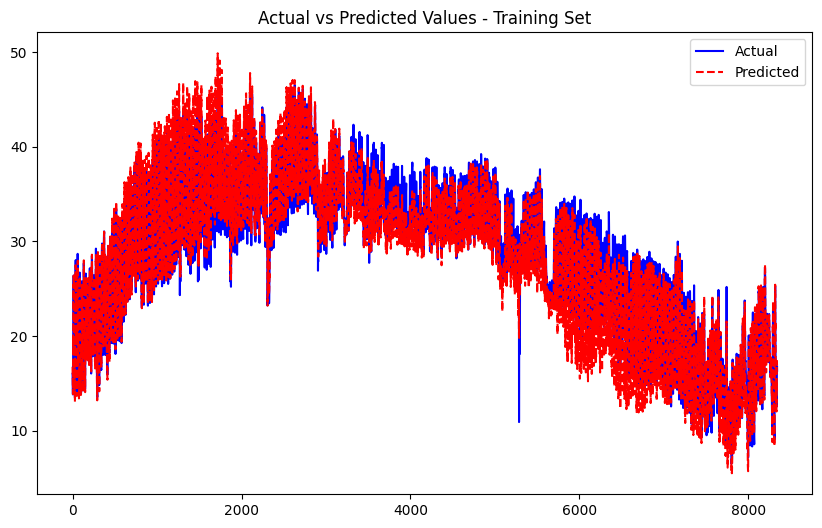

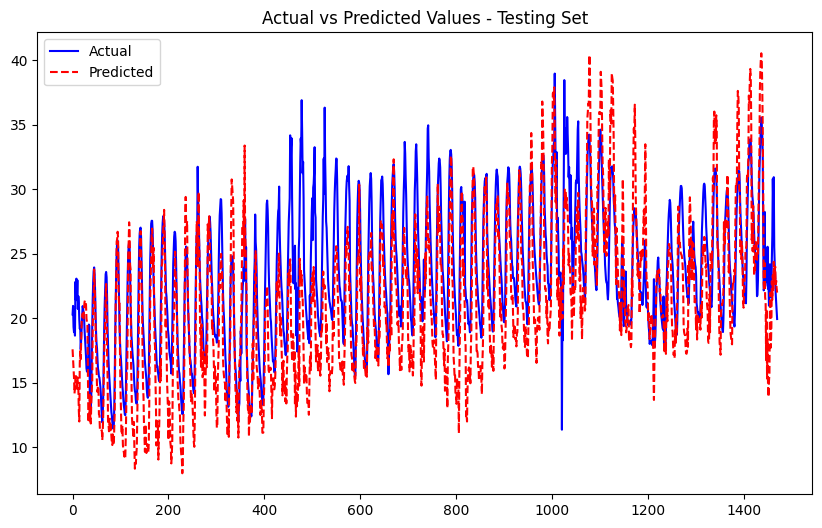

Processing node 19...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0856
Epoch [2/50], Train Loss: 0.0668
Epoch [3/50], Train Loss: 0.0580
Epoch [4/50], Train Loss: 0.0536
Epoch [5/50], Train Loss: 0.0500
Epoch [6/50], Train Loss: 0.0472
Epoch [7/50], Train Loss: 0.0460
Epoch [8/50], Train Loss: 0.0446
Epoch [9/50], Train Loss: 0.0435
Epoch [10/50], Train Loss: 0.0428
Epoch [11/50], Train Loss: 0.0422
Epoch [12/50], Train Loss: 0.0414
Epoch [13/50], Train Loss: 0.0407
Epoch [14/50], Train Loss: 0.0401
Epoch [15/50], Train Loss: 0.0400
Epoch [16/50], Train Loss: 0.0397
Epoch [17/50], Train Loss: 0.0394
Epoch [18/50], Train Loss: 0.0387
Epoch [19/50], Train Loss: 0.0387
Epoch [20/50], Train Loss: 0.0381
Epoch [21/50], Train Loss: 0.0374
Epoch [22/50], Train Loss: 0.0377
Epoch [23/50], Train Loss: 0.0376
Epoch [24/50], Train Loss: 0.0374
Epoch [25/50], Train Loss: 0.0367
Epoch [26/50], Train Loss: 0.0369
Epoch [27/50], Train Loss: 0.0371
Epoch [28/50], Train Loss: 0.0367
Epoch [29/50], Train Loss: 0.0366
Epoch [30/50], Train Lo

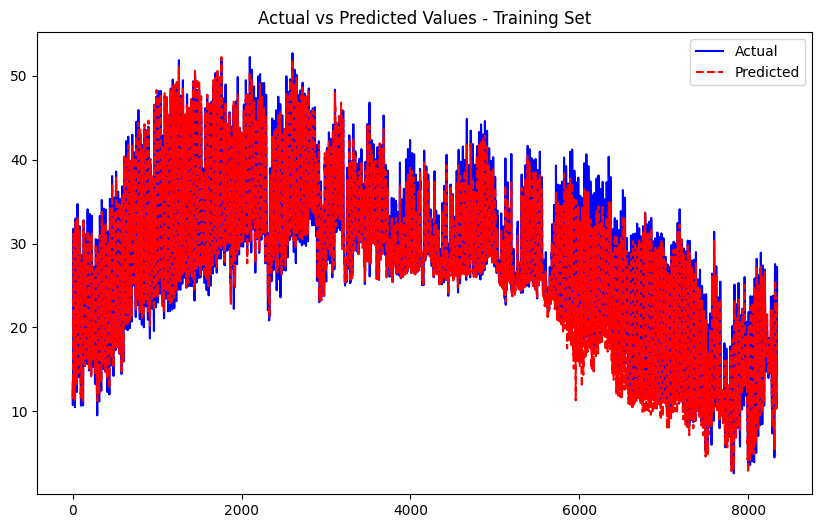

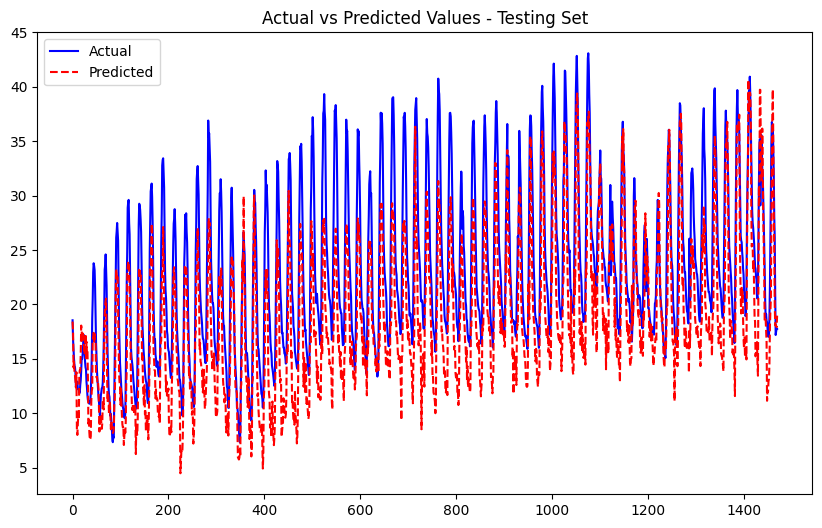

Processing node 20...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0684
Epoch [2/50], Train Loss: 0.0558
Epoch [3/50], Train Loss: 0.0492
Epoch [4/50], Train Loss: 0.0458
Epoch [5/50], Train Loss: 0.0421
Epoch [6/50], Train Loss: 0.0398
Epoch [7/50], Train Loss: 0.0388
Epoch [8/50], Train Loss: 0.0374
Epoch [9/50], Train Loss: 0.0354
Epoch [10/50], Train Loss: 0.0348
Epoch [11/50], Train Loss: 0.0343
Epoch [12/50], Train Loss: 0.0335
Epoch [13/50], Train Loss: 0.0333
Epoch [14/50], Train Loss: 0.0324
Epoch [15/50], Train Loss: 0.0321
Epoch [16/50], Train Loss: 0.0321
Epoch [17/50], Train Loss: 0.0314
Epoch [18/50], Train Loss: 0.0311
Epoch [19/50], Train Loss: 0.0310
Epoch [20/50], Train Loss: 0.0313
Epoch [21/50], Train Loss: 0.0304
Epoch [22/50], Train Loss: 0.0302
Epoch [23/50], Train Loss: 0.0302
Epoch [24/50], Train Loss: 0.0300
Epoch [25/50], Train Loss: 0.0295
Epoch [26/50], Train Loss: 0.0295
Epoch [27/50], Train Loss: 0.0297
Epoch [28/50], Train Loss: 0.0291
Epoch [29/50], Train Loss: 0.0288
Epoch [30/50], Train Lo

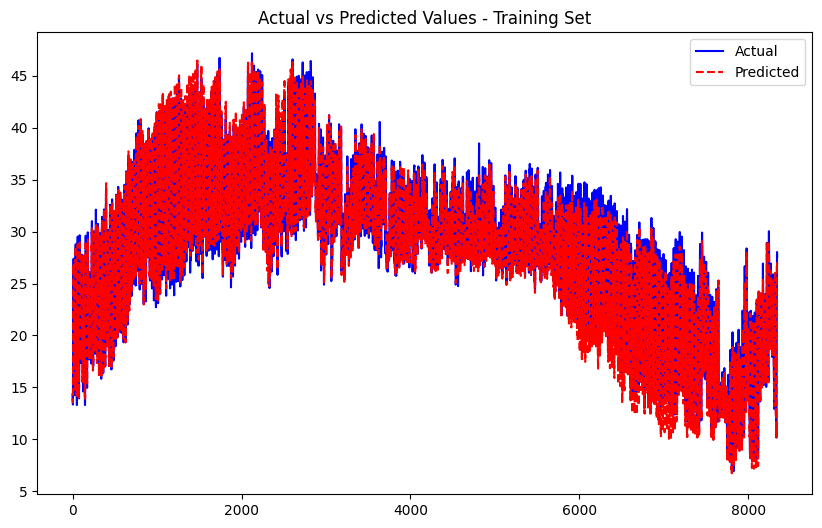

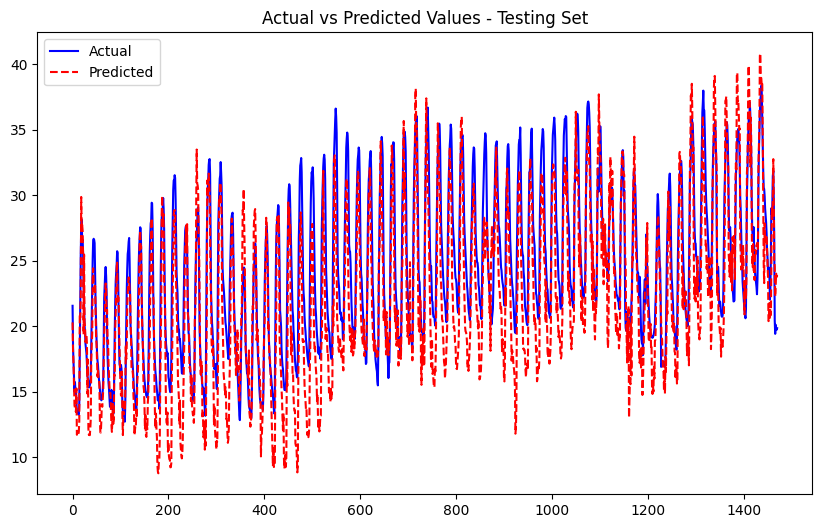

Processing node 21...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0607
Epoch [2/50], Train Loss: 0.0485
Epoch [3/50], Train Loss: 0.0438
Epoch [4/50], Train Loss: 0.0405
Epoch [5/50], Train Loss: 0.0384
Epoch [6/50], Train Loss: 0.0368
Epoch [7/50], Train Loss: 0.0353
Epoch [8/50], Train Loss: 0.0341
Epoch [9/50], Train Loss: 0.0343
Epoch [10/50], Train Loss: 0.0335
Epoch [11/50], Train Loss: 0.0322
Epoch [12/50], Train Loss: 0.0329
Epoch [13/50], Train Loss: 0.0320
Epoch [14/50], Train Loss: 0.0317
Epoch [15/50], Train Loss: 0.0320
Epoch [16/50], Train Loss: 0.0313
Epoch [17/50], Train Loss: 0.0310
Epoch [18/50], Train Loss: 0.0312
Epoch [19/50], Train Loss: 0.0308
Epoch [20/50], Train Loss: 0.0310
Epoch [21/50], Train Loss: 0.0302
Epoch [22/50], Train Loss: 0.0299
Epoch [23/50], Train Loss: 0.0299
Epoch [24/50], Train Loss: 0.0296
Epoch [25/50], Train Loss: 0.0298
Epoch [26/50], Train Loss: 0.0293
Epoch [27/50], Train Loss: 0.0291
Epoch [28/50], Train Loss: 0.0287
Epoch [29/50], Train Loss: 0.0290
Epoch [30/50], Train Lo

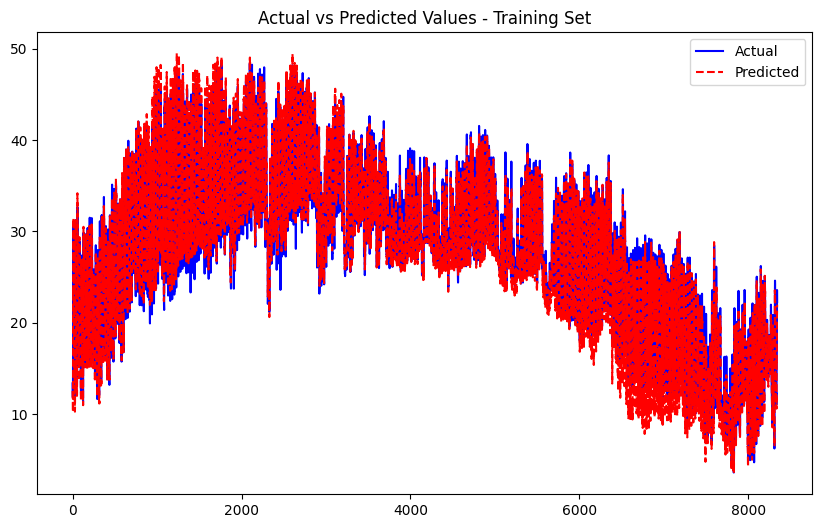

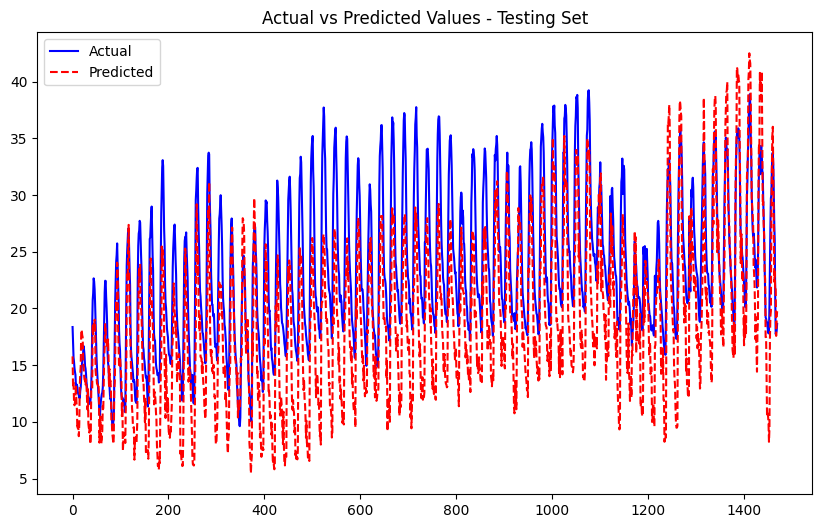

Processing node 22...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0665
Epoch [2/50], Train Loss: 0.0573
Epoch [3/50], Train Loss: 0.0516
Epoch [4/50], Train Loss: 0.0484
Epoch [5/50], Train Loss: 0.0461
Epoch [6/50], Train Loss: 0.0443
Epoch [7/50], Train Loss: 0.0420
Epoch [8/50], Train Loss: 0.0410
Epoch [9/50], Train Loss: 0.0405
Epoch [10/50], Train Loss: 0.0395
Epoch [11/50], Train Loss: 0.0389
Epoch [12/50], Train Loss: 0.0386
Epoch [13/50], Train Loss: 0.0380
Epoch [14/50], Train Loss: 0.0377
Epoch [15/50], Train Loss: 0.0383
Epoch [16/50], Train Loss: 0.0370
Epoch [17/50], Train Loss: 0.0373
Epoch [18/50], Train Loss: 0.0365
Epoch [19/50], Train Loss: 0.0367
Epoch [20/50], Train Loss: 0.0359
Epoch [21/50], Train Loss: 0.0364
Epoch [22/50], Train Loss: 0.0358
Epoch [23/50], Train Loss: 0.0354
Epoch [24/50], Train Loss: 0.0354
Epoch [25/50], Train Loss: 0.0354
Epoch [26/50], Train Loss: 0.0352
Epoch [27/50], Train Loss: 0.0351
Epoch [28/50], Train Loss: 0.0346
Epoch [29/50], Train Loss: 0.0349
Epoch [30/50], Train Lo

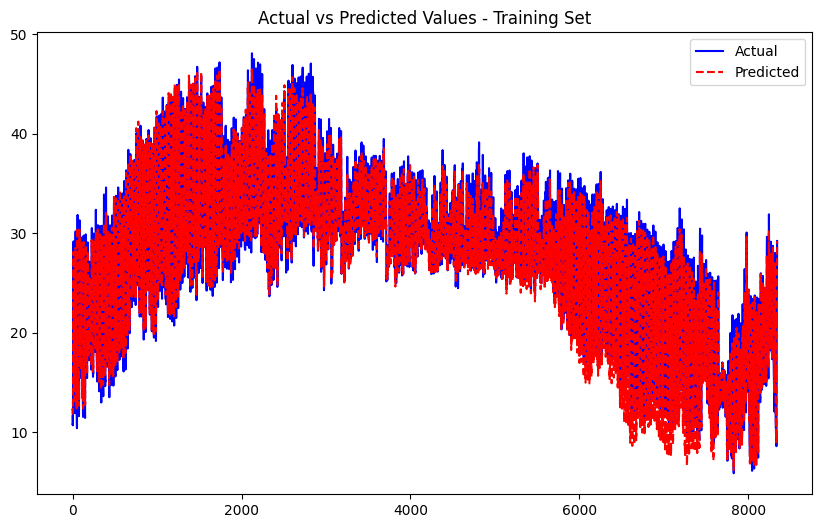

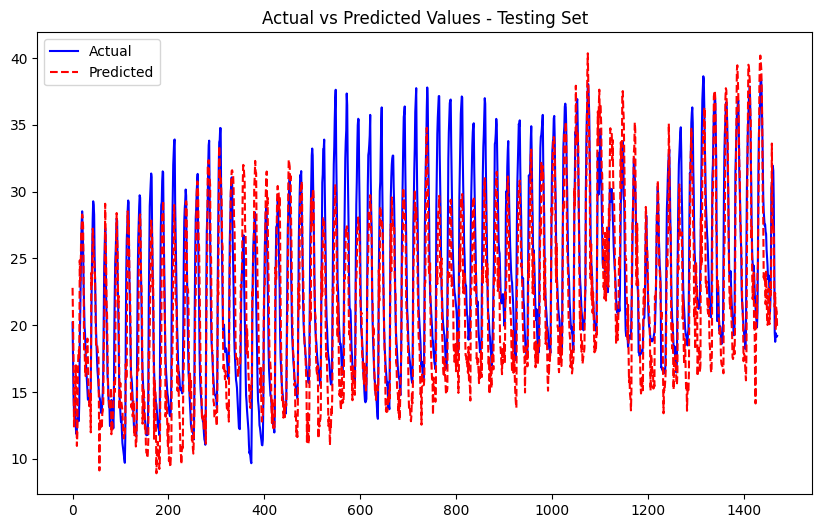

Processing node 23...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0685
Epoch [2/50], Train Loss: 0.0591
Epoch [3/50], Train Loss: 0.0537
Epoch [4/50], Train Loss: 0.0486
Epoch [5/50], Train Loss: 0.0459
Epoch [6/50], Train Loss: 0.0432
Epoch [7/50], Train Loss: 0.0414
Epoch [8/50], Train Loss: 0.0407
Epoch [9/50], Train Loss: 0.0387
Epoch [10/50], Train Loss: 0.0374
Epoch [11/50], Train Loss: 0.0372
Epoch [12/50], Train Loss: 0.0366
Epoch [13/50], Train Loss: 0.0356
Epoch [14/50], Train Loss: 0.0348
Epoch [15/50], Train Loss: 0.0347
Epoch [16/50], Train Loss: 0.0340
Epoch [17/50], Train Loss: 0.0332
Epoch [18/50], Train Loss: 0.0327
Epoch [19/50], Train Loss: 0.0326
Epoch [20/50], Train Loss: 0.0323
Epoch [21/50], Train Loss: 0.0317
Epoch [22/50], Train Loss: 0.0324
Epoch [23/50], Train Loss: 0.0321
Epoch [24/50], Train Loss: 0.0318
Epoch [25/50], Train Loss: 0.0312
Epoch [26/50], Train Loss: 0.0315
Epoch [27/50], Train Loss: 0.0316
Epoch [28/50], Train Loss: 0.0315
Epoch [29/50], Train Loss: 0.0309
Epoch [30/50], Train Lo

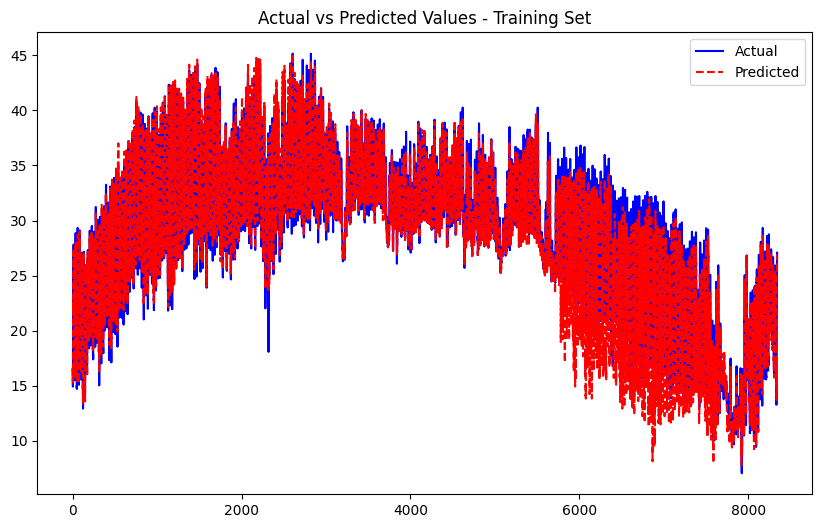

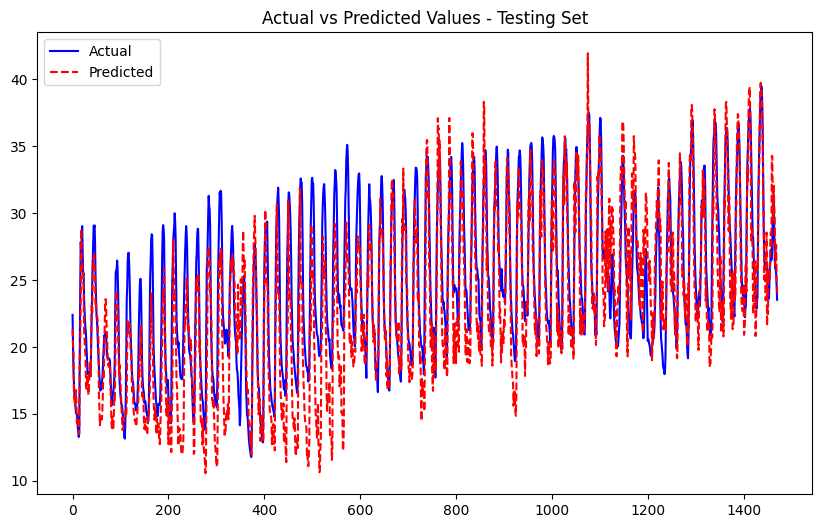

Processing node 24...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0591
Epoch [2/50], Train Loss: 0.0496
Epoch [3/50], Train Loss: 0.0437
Epoch [4/50], Train Loss: 0.0401
Epoch [5/50], Train Loss: 0.0380
Epoch [6/50], Train Loss: 0.0359
Epoch [7/50], Train Loss: 0.0334
Epoch [8/50], Train Loss: 0.0333
Epoch [9/50], Train Loss: 0.0317
Epoch [10/50], Train Loss: 0.0315
Epoch [11/50], Train Loss: 0.0308
Epoch [12/50], Train Loss: 0.0303
Epoch [13/50], Train Loss: 0.0300
Epoch [14/50], Train Loss: 0.0295
Epoch [15/50], Train Loss: 0.0287
Epoch [16/50], Train Loss: 0.0284
Epoch [17/50], Train Loss: 0.0276
Epoch [18/50], Train Loss: 0.0282
Epoch [19/50], Train Loss: 0.0284
Epoch [20/50], Train Loss: 0.0280
Epoch [21/50], Train Loss: 0.0272
Epoch [22/50], Train Loss: 0.0277
Epoch [23/50], Train Loss: 0.0278
Epoch [24/50], Train Loss: 0.0273
Epoch [25/50], Train Loss: 0.0272
Epoch [26/50], Train Loss: 0.0268
Epoch [27/50], Train Loss: 0.0271
Epoch [28/50], Train Loss: 0.0270
Epoch [29/50], Train Loss: 0.0266
Epoch [30/50], Train Lo

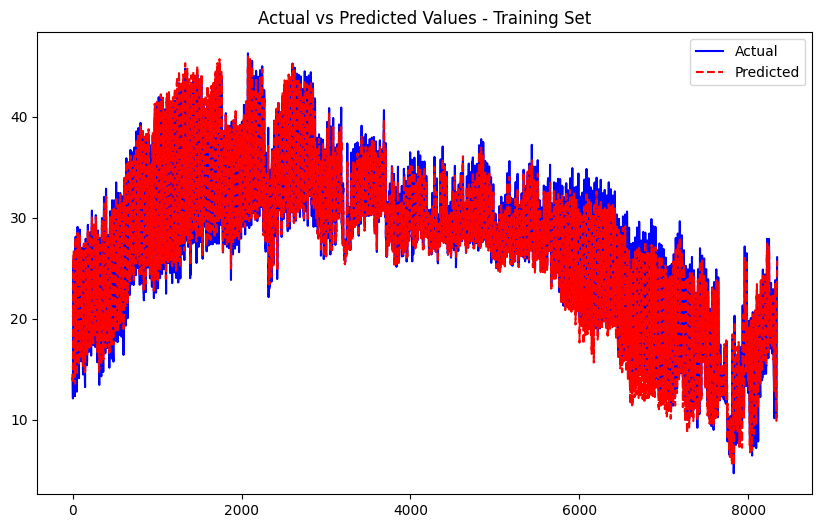

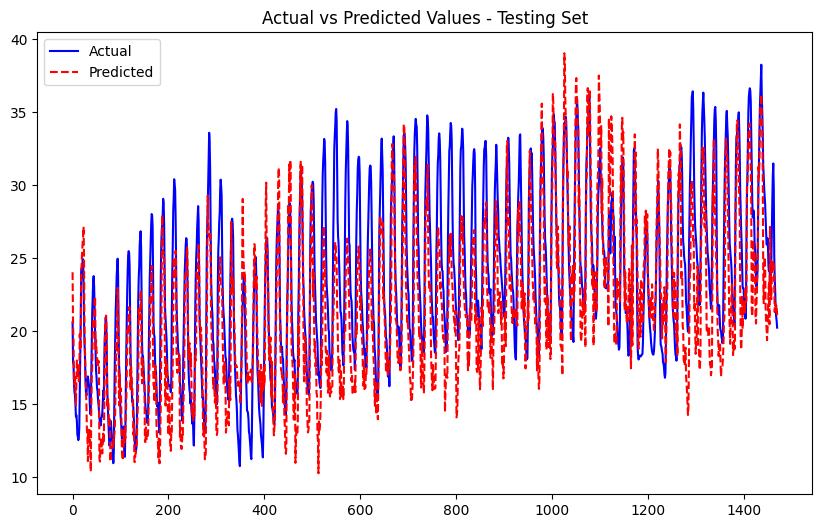

Processing node 25...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0545
Epoch [2/50], Train Loss: 0.0472
Epoch [3/50], Train Loss: 0.0425
Epoch [4/50], Train Loss: 0.0385
Epoch [5/50], Train Loss: 0.0361
Epoch [6/50], Train Loss: 0.0344
Epoch [7/50], Train Loss: 0.0328
Epoch [8/50], Train Loss: 0.0319
Epoch [9/50], Train Loss: 0.0310
Epoch [10/50], Train Loss: 0.0299
Epoch [11/50], Train Loss: 0.0288
Epoch [12/50], Train Loss: 0.0288
Epoch [13/50], Train Loss: 0.0279
Epoch [14/50], Train Loss: 0.0277
Epoch [15/50], Train Loss: 0.0273
Epoch [16/50], Train Loss: 0.0269
Epoch [17/50], Train Loss: 0.0264
Epoch [18/50], Train Loss: 0.0268
Epoch [19/50], Train Loss: 0.0258
Epoch [20/50], Train Loss: 0.0262
Epoch [21/50], Train Loss: 0.0261
Epoch [22/50], Train Loss: 0.0258
Epoch [23/50], Train Loss: 0.0256
Epoch [24/50], Train Loss: 0.0253
Epoch [25/50], Train Loss: 0.0252
Epoch [26/50], Train Loss: 0.0254
Epoch [27/50], Train Loss: 0.0249
Epoch [28/50], Train Loss: 0.0249
Epoch [29/50], Train Loss: 0.0252
Epoch [30/50], Train Lo

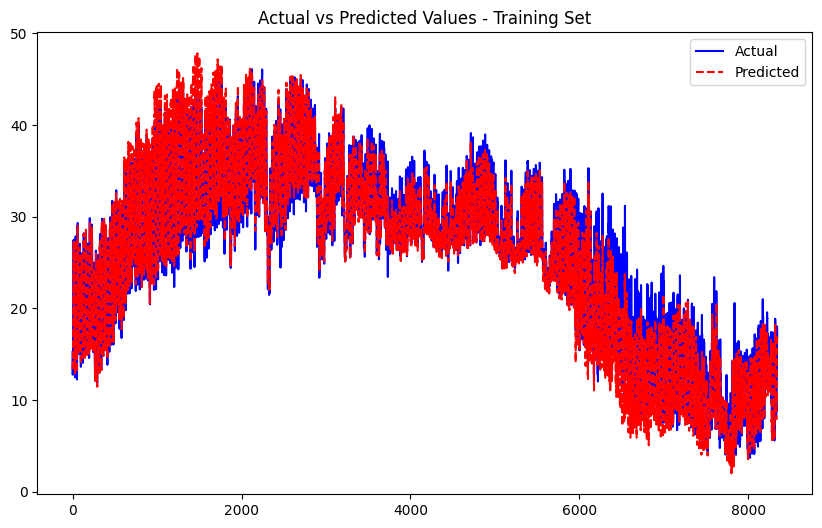

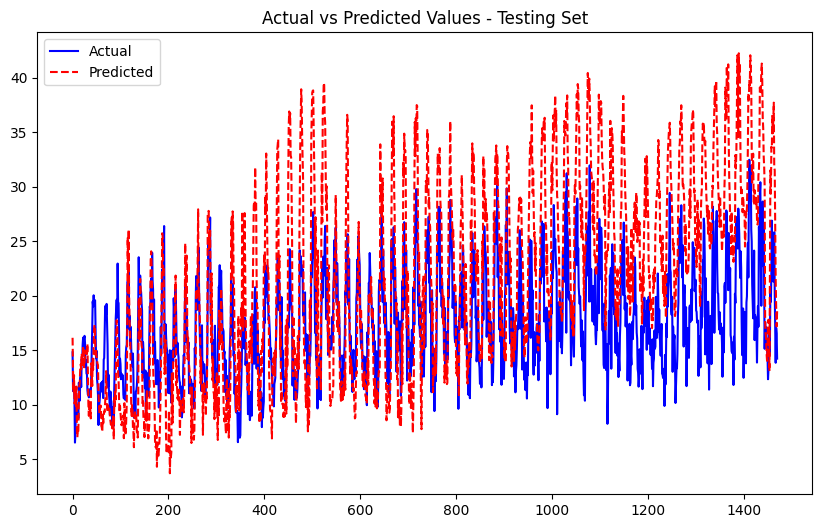

Processing node 26...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0690
Epoch [2/50], Train Loss: 0.0548
Epoch [3/50], Train Loss: 0.0484
Epoch [4/50], Train Loss: 0.0435
Epoch [5/50], Train Loss: 0.0402
Epoch [6/50], Train Loss: 0.0379
Epoch [7/50], Train Loss: 0.0360
Epoch [8/50], Train Loss: 0.0355
Epoch [9/50], Train Loss: 0.0339
Epoch [10/50], Train Loss: 0.0335
Epoch [11/50], Train Loss: 0.0326
Epoch [12/50], Train Loss: 0.0328
Epoch [13/50], Train Loss: 0.0317
Epoch [14/50], Train Loss: 0.0312
Epoch [15/50], Train Loss: 0.0309
Epoch [16/50], Train Loss: 0.0308
Epoch [17/50], Train Loss: 0.0305
Epoch [18/50], Train Loss: 0.0301
Epoch [19/50], Train Loss: 0.0297
Epoch [20/50], Train Loss: 0.0294
Epoch [21/50], Train Loss: 0.0289
Epoch [22/50], Train Loss: 0.0287
Epoch [23/50], Train Loss: 0.0282
Epoch [24/50], Train Loss: 0.0283
Epoch [25/50], Train Loss: 0.0281
Epoch [26/50], Train Loss: 0.0282
Epoch [27/50], Train Loss: 0.0281
Epoch [28/50], Train Loss: 0.0284
Epoch [29/50], Train Loss: 0.0276
Epoch [30/50], Train Lo

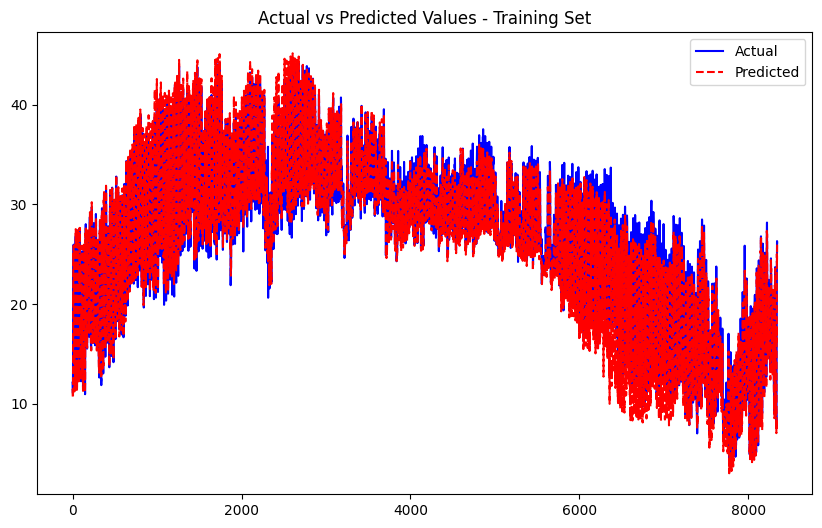

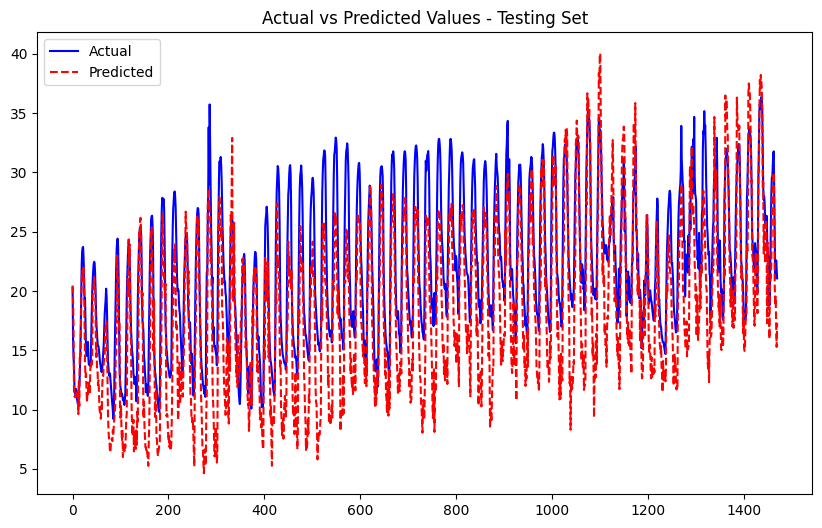

Processing node 27...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0582
Epoch [2/50], Train Loss: 0.0510
Epoch [3/50], Train Loss: 0.0460
Epoch [4/50], Train Loss: 0.0420
Epoch [5/50], Train Loss: 0.0400
Epoch [6/50], Train Loss: 0.0386
Epoch [7/50], Train Loss: 0.0376
Epoch [8/50], Train Loss: 0.0360
Epoch [9/50], Train Loss: 0.0348
Epoch [10/50], Train Loss: 0.0342
Epoch [11/50], Train Loss: 0.0336
Epoch [12/50], Train Loss: 0.0332
Epoch [13/50], Train Loss: 0.0329
Epoch [14/50], Train Loss: 0.0325
Epoch [15/50], Train Loss: 0.0317
Epoch [16/50], Train Loss: 0.0312
Epoch [17/50], Train Loss: 0.0312
Epoch [18/50], Train Loss: 0.0314
Epoch [19/50], Train Loss: 0.0310
Epoch [20/50], Train Loss: 0.0308
Epoch [21/50], Train Loss: 0.0304
Epoch [22/50], Train Loss: 0.0305
Epoch [23/50], Train Loss: 0.0304
Epoch [24/50], Train Loss: 0.0301
Epoch [25/50], Train Loss: 0.0300
Epoch [26/50], Train Loss: 0.0301
Epoch [27/50], Train Loss: 0.0304
Epoch [28/50], Train Loss: 0.0295
Epoch [29/50], Train Loss: 0.0293
Epoch [30/50], Train Lo

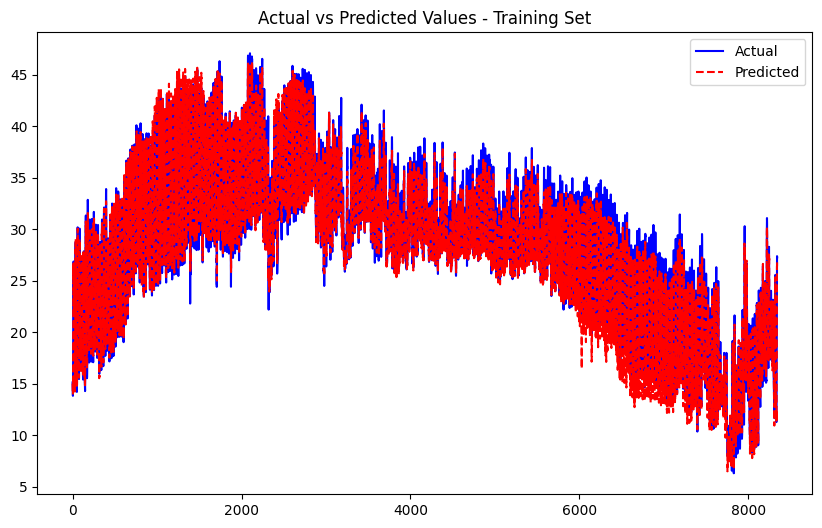

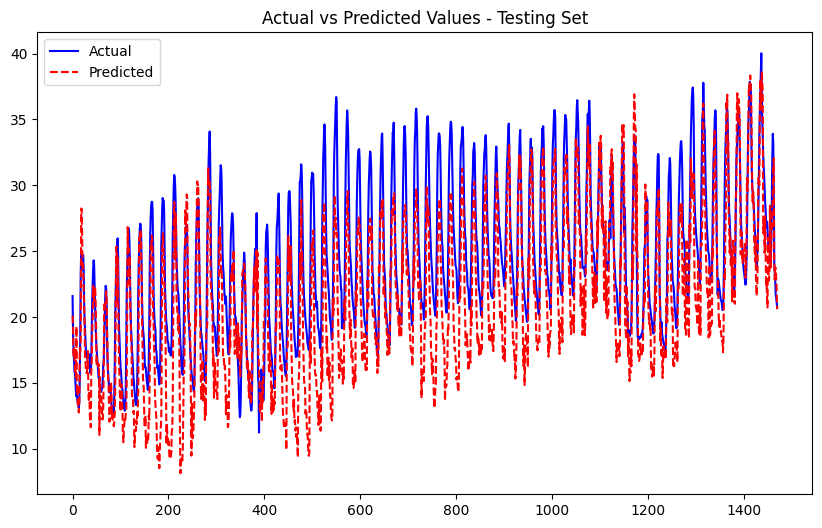

Processing node 28...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0595
Epoch [2/50], Train Loss: 0.0481
Epoch [3/50], Train Loss: 0.0423
Epoch [4/50], Train Loss: 0.0389
Epoch [5/50], Train Loss: 0.0365
Epoch [6/50], Train Loss: 0.0344
Epoch [7/50], Train Loss: 0.0331
Epoch [8/50], Train Loss: 0.0324
Epoch [9/50], Train Loss: 0.0317
Epoch [10/50], Train Loss: 0.0307
Epoch [11/50], Train Loss: 0.0305
Epoch [12/50], Train Loss: 0.0298
Epoch [13/50], Train Loss: 0.0296
Epoch [14/50], Train Loss: 0.0290
Epoch [15/50], Train Loss: 0.0287
Epoch [16/50], Train Loss: 0.0283
Epoch [17/50], Train Loss: 0.0282
Epoch [18/50], Train Loss: 0.0281
Epoch [19/50], Train Loss: 0.0277
Epoch [20/50], Train Loss: 0.0272
Epoch [21/50], Train Loss: 0.0275
Epoch [22/50], Train Loss: 0.0277
Epoch [23/50], Train Loss: 0.0274
Epoch [24/50], Train Loss: 0.0271
Epoch [25/50], Train Loss: 0.0274
Epoch [26/50], Train Loss: 0.0268
Epoch [27/50], Train Loss: 0.0267
Epoch [28/50], Train Loss: 0.0268
Epoch [29/50], Train Loss: 0.0267
Epoch [30/50], Train Lo

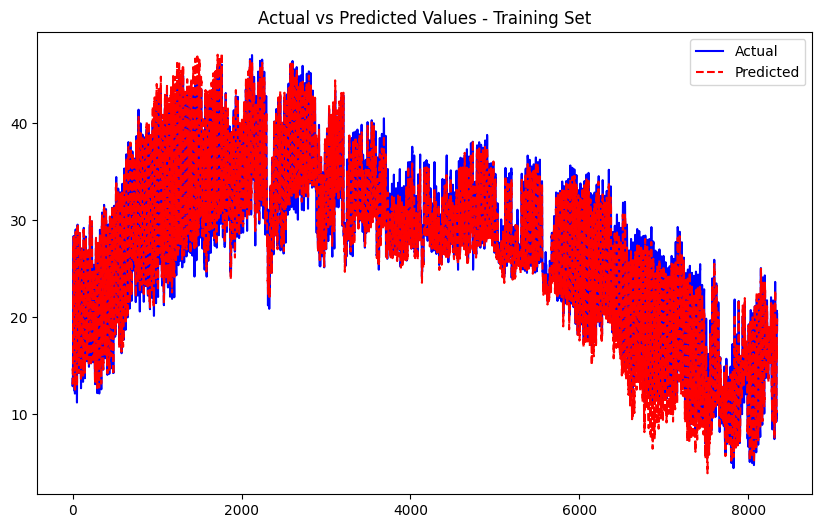

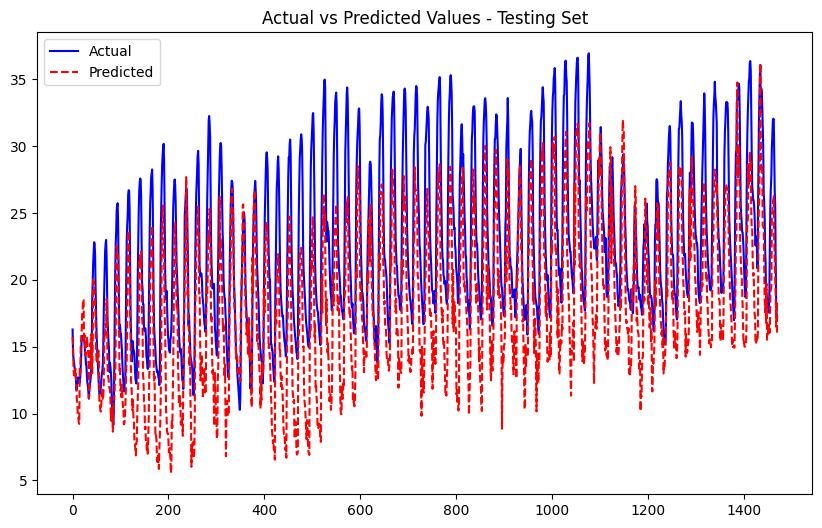

Processing node 29...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0552
Epoch [2/50], Train Loss: 0.0476
Epoch [3/50], Train Loss: 0.0436
Epoch [4/50], Train Loss: 0.0398
Epoch [5/50], Train Loss: 0.0382
Epoch [6/50], Train Loss: 0.0356
Epoch [7/50], Train Loss: 0.0343
Epoch [8/50], Train Loss: 0.0331
Epoch [9/50], Train Loss: 0.0323
Epoch [10/50], Train Loss: 0.0314
Epoch [11/50], Train Loss: 0.0307
Epoch [12/50], Train Loss: 0.0307
Epoch [13/50], Train Loss: 0.0299
Epoch [14/50], Train Loss: 0.0298
Epoch [15/50], Train Loss: 0.0293
Epoch [16/50], Train Loss: 0.0286
Epoch [17/50], Train Loss: 0.0284
Epoch [18/50], Train Loss: 0.0283
Epoch [19/50], Train Loss: 0.0280
Epoch [20/50], Train Loss: 0.0279
Epoch [21/50], Train Loss: 0.0276
Epoch [22/50], Train Loss: 0.0274
Epoch [23/50], Train Loss: 0.0272
Epoch [24/50], Train Loss: 0.0272
Epoch [25/50], Train Loss: 0.0272
Epoch [26/50], Train Loss: 0.0273
Epoch [27/50], Train Loss: 0.0275
Epoch [28/50], Train Loss: 0.0269
Epoch [29/50], Train Loss: 0.0268
Epoch [30/50], Train Lo

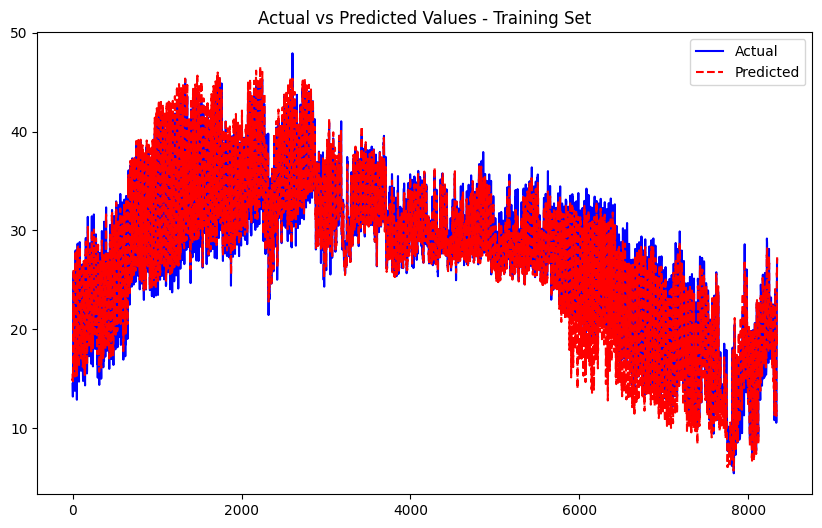

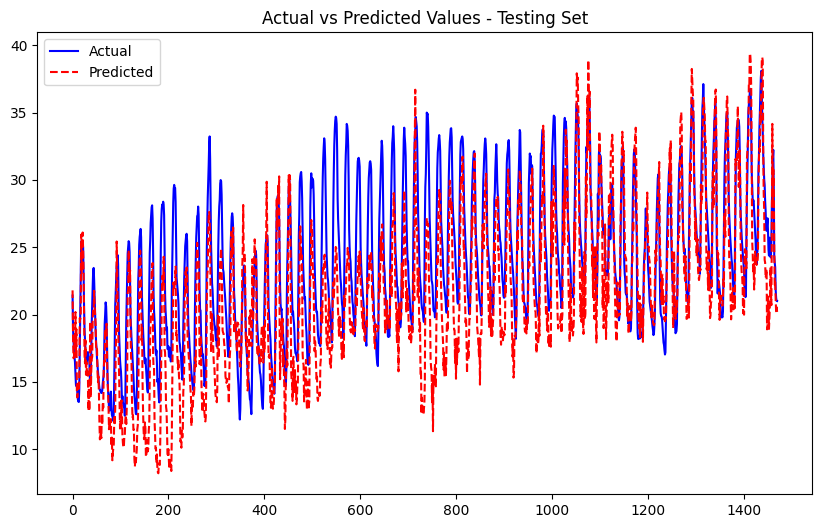

Processing node 30...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0688
Epoch [2/50], Train Loss: 0.0568
Epoch [3/50], Train Loss: 0.0510
Epoch [4/50], Train Loss: 0.0470
Epoch [5/50], Train Loss: 0.0444
Epoch [6/50], Train Loss: 0.0432
Epoch [7/50], Train Loss: 0.0418
Epoch [8/50], Train Loss: 0.0405
Epoch [9/50], Train Loss: 0.0401
Epoch [10/50], Train Loss: 0.0390
Epoch [11/50], Train Loss: 0.0383
Epoch [12/50], Train Loss: 0.0380
Epoch [13/50], Train Loss: 0.0377
Epoch [14/50], Train Loss: 0.0370
Epoch [15/50], Train Loss: 0.0365
Epoch [16/50], Train Loss: 0.0363
Epoch [17/50], Train Loss: 0.0363
Epoch [18/50], Train Loss: 0.0358
Epoch [19/50], Train Loss: 0.0357
Epoch [20/50], Train Loss: 0.0358
Epoch [21/50], Train Loss: 0.0353
Epoch [22/50], Train Loss: 0.0351
Epoch [23/50], Train Loss: 0.0350
Epoch [24/50], Train Loss: 0.0349
Epoch [25/50], Train Loss: 0.0350
Epoch [26/50], Train Loss: 0.0348
Epoch [27/50], Train Loss: 0.0349
Epoch [28/50], Train Loss: 0.0345
Epoch [29/50], Train Loss: 0.0345
Epoch [30/50], Train Lo

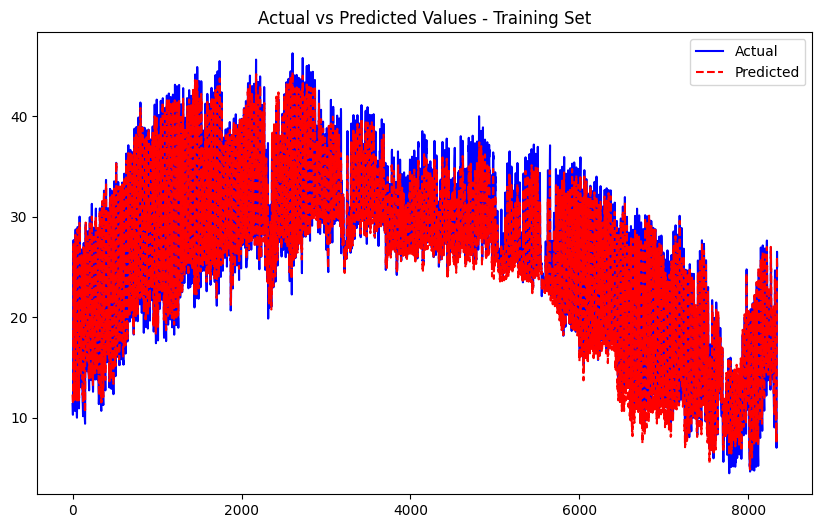

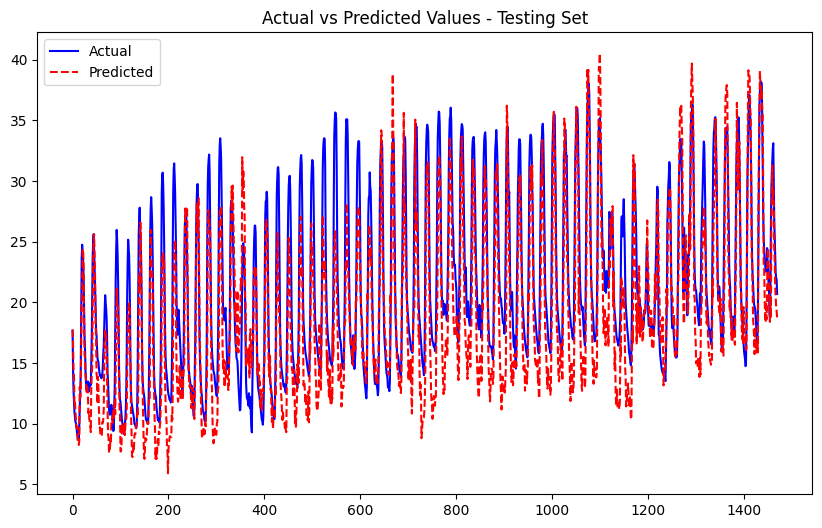

Processing node 31...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0559
Epoch [2/50], Train Loss: 0.0479
Epoch [3/50], Train Loss: 0.0432
Epoch [4/50], Train Loss: 0.0401
Epoch [5/50], Train Loss: 0.0386
Epoch [6/50], Train Loss: 0.0366
Epoch [7/50], Train Loss: 0.0358
Epoch [8/50], Train Loss: 0.0349
Epoch [9/50], Train Loss: 0.0344
Epoch [10/50], Train Loss: 0.0341
Epoch [11/50], Train Loss: 0.0332
Epoch [12/50], Train Loss: 0.0332
Epoch [13/50], Train Loss: 0.0329
Epoch [14/50], Train Loss: 0.0327
Epoch [15/50], Train Loss: 0.0325
Epoch [16/50], Train Loss: 0.0325
Epoch [17/50], Train Loss: 0.0321
Epoch [18/50], Train Loss: 0.0317
Epoch [19/50], Train Loss: 0.0314
Epoch [20/50], Train Loss: 0.0320
Epoch [21/50], Train Loss: 0.0315
Epoch [22/50], Train Loss: 0.0312
Epoch [23/50], Train Loss: 0.0310
Epoch [24/50], Train Loss: 0.0309
Epoch [25/50], Train Loss: 0.0311
Epoch [26/50], Train Loss: 0.0309
Epoch [27/50], Train Loss: 0.0309
Epoch [28/50], Train Loss: 0.0307
Epoch [29/50], Train Loss: 0.0309
Epoch [30/50], Train Lo

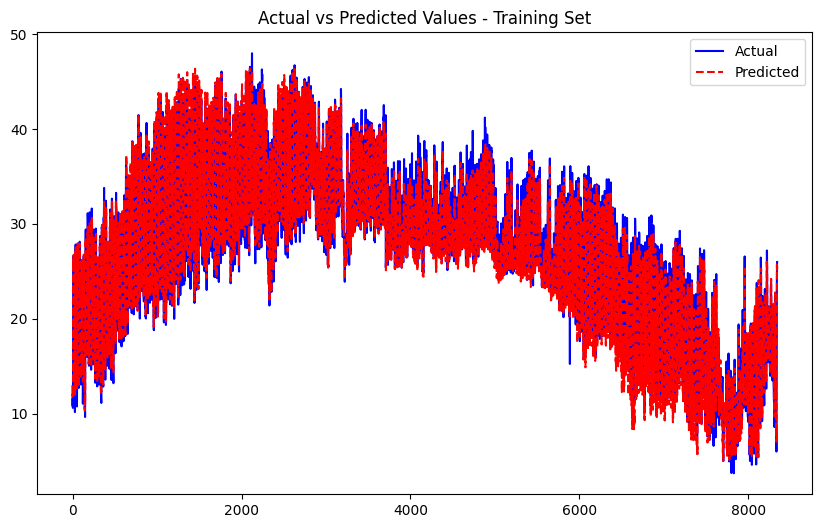

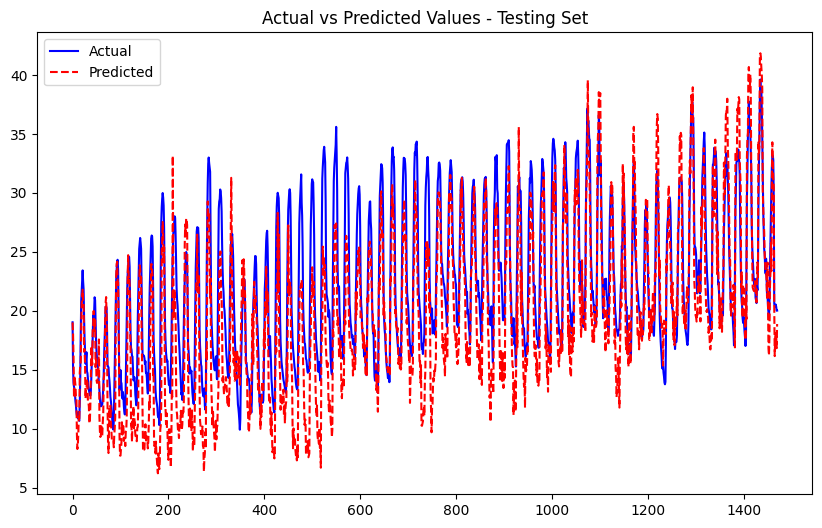

Processing node 32...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0573
Epoch [2/50], Train Loss: 0.0488
Epoch [3/50], Train Loss: 0.0426
Epoch [4/50], Train Loss: 0.0394
Epoch [5/50], Train Loss: 0.0376
Epoch [6/50], Train Loss: 0.0361
Epoch [7/50], Train Loss: 0.0342
Epoch [8/50], Train Loss: 0.0341
Epoch [9/50], Train Loss: 0.0325
Epoch [10/50], Train Loss: 0.0322
Epoch [11/50], Train Loss: 0.0320
Epoch [12/50], Train Loss: 0.0312
Epoch [13/50], Train Loss: 0.0311
Epoch [14/50], Train Loss: 0.0303
Epoch [15/50], Train Loss: 0.0302
Epoch [16/50], Train Loss: 0.0298
Epoch [17/50], Train Loss: 0.0297
Epoch [18/50], Train Loss: 0.0291
Epoch [19/50], Train Loss: 0.0287
Epoch [20/50], Train Loss: 0.0295
Epoch [21/50], Train Loss: 0.0290
Epoch [22/50], Train Loss: 0.0286
Epoch [23/50], Train Loss: 0.0287
Epoch [24/50], Train Loss: 0.0283
Epoch [25/50], Train Loss: 0.0283
Epoch [26/50], Train Loss: 0.0278
Epoch [27/50], Train Loss: 0.0281
Epoch [28/50], Train Loss: 0.0280
Epoch [29/50], Train Loss: 0.0282
Epoch [30/50], Train Lo

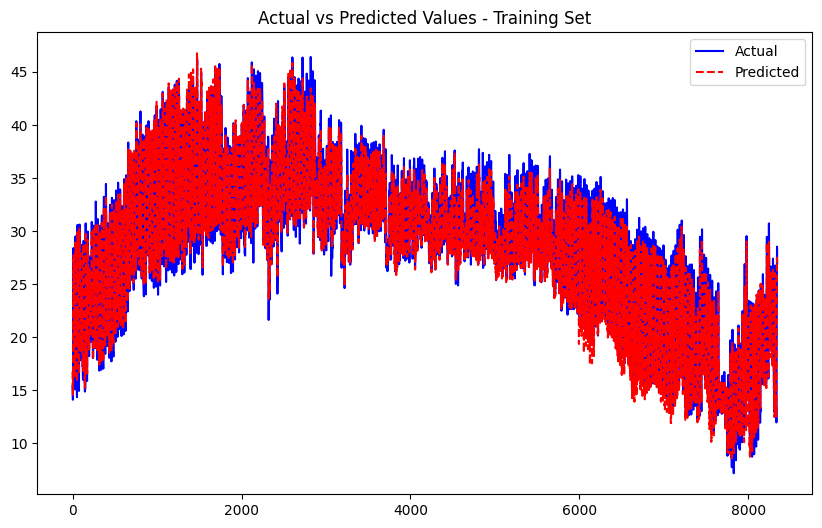

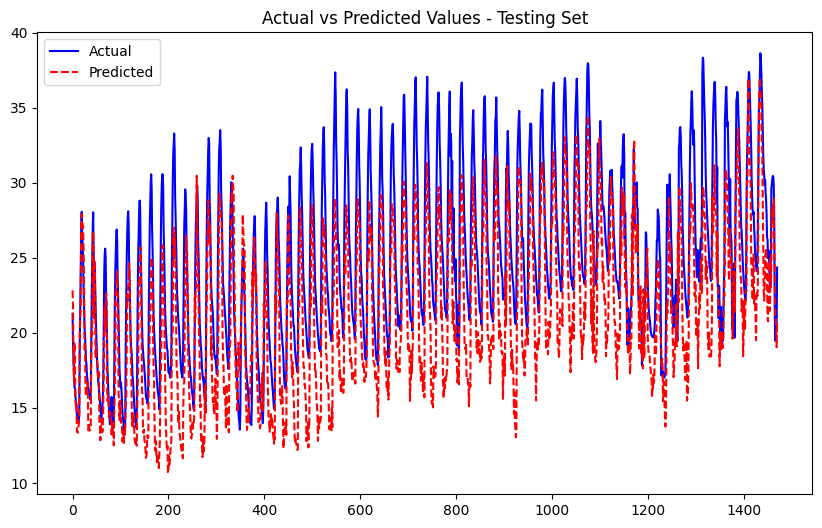

Processing node 33...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0767
Epoch [2/50], Train Loss: 0.0649
Epoch [3/50], Train Loss: 0.0574
Epoch [4/50], Train Loss: 0.0530
Epoch [5/50], Train Loss: 0.0496
Epoch [6/50], Train Loss: 0.0462
Epoch [7/50], Train Loss: 0.0437
Epoch [8/50], Train Loss: 0.0420
Epoch [9/50], Train Loss: 0.0405
Epoch [10/50], Train Loss: 0.0387
Epoch [11/50], Train Loss: 0.0378
Epoch [12/50], Train Loss: 0.0370
Epoch [13/50], Train Loss: 0.0365
Epoch [14/50], Train Loss: 0.0355
Epoch [15/50], Train Loss: 0.0354
Epoch [16/50], Train Loss: 0.0351
Epoch [17/50], Train Loss: 0.0344
Epoch [18/50], Train Loss: 0.0339
Epoch [19/50], Train Loss: 0.0335
Epoch [20/50], Train Loss: 0.0337
Epoch [21/50], Train Loss: 0.0333
Epoch [22/50], Train Loss: 0.0328
Epoch [23/50], Train Loss: 0.0326
Epoch [24/50], Train Loss: 0.0326
Epoch [25/50], Train Loss: 0.0324
Epoch [26/50], Train Loss: 0.0321
Epoch [27/50], Train Loss: 0.0321
Epoch [28/50], Train Loss: 0.0315
Epoch [29/50], Train Loss: 0.0318
Epoch [30/50], Train Lo

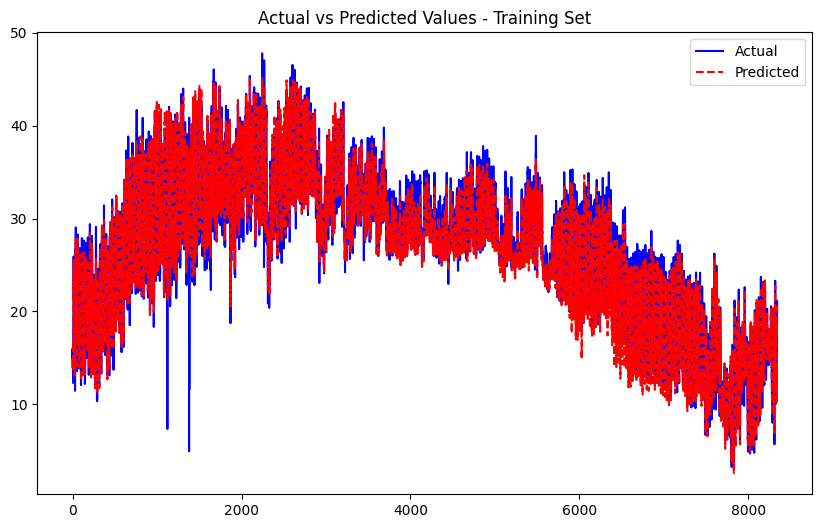

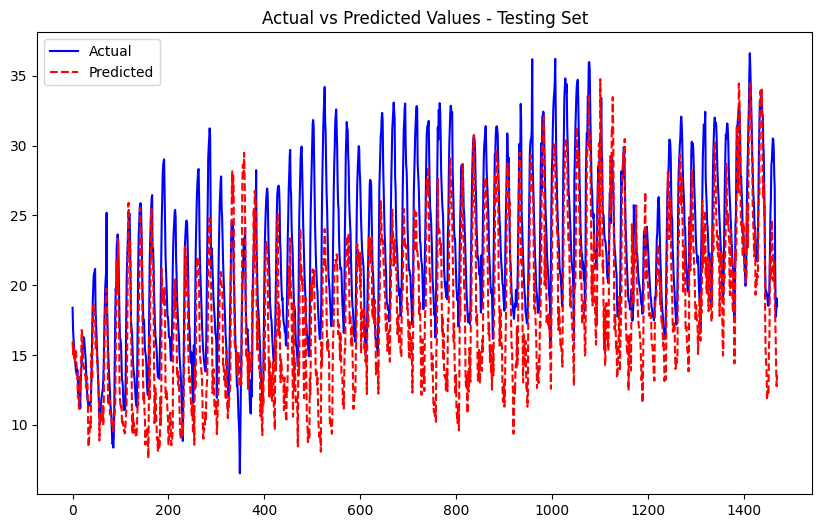

Processing node 34...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0603
Epoch [2/50], Train Loss: 0.0482
Epoch [3/50], Train Loss: 0.0418
Epoch [4/50], Train Loss: 0.0393
Epoch [5/50], Train Loss: 0.0366
Epoch [6/50], Train Loss: 0.0350
Epoch [7/50], Train Loss: 0.0332
Epoch [8/50], Train Loss: 0.0323
Epoch [9/50], Train Loss: 0.0316
Epoch [10/50], Train Loss: 0.0310
Epoch [11/50], Train Loss: 0.0301
Epoch [12/50], Train Loss: 0.0299
Epoch [13/50], Train Loss: 0.0295
Epoch [14/50], Train Loss: 0.0293
Epoch [15/50], Train Loss: 0.0291
Epoch [16/50], Train Loss: 0.0282
Epoch [17/50], Train Loss: 0.0281
Epoch [18/50], Train Loss: 0.0283
Epoch [19/50], Train Loss: 0.0280
Epoch [20/50], Train Loss: 0.0275
Epoch [21/50], Train Loss: 0.0278
Epoch [22/50], Train Loss: 0.0274
Epoch [23/50], Train Loss: 0.0274
Epoch [24/50], Train Loss: 0.0268
Epoch [25/50], Train Loss: 0.0270
Epoch [26/50], Train Loss: 0.0272
Epoch [27/50], Train Loss: 0.0273
Epoch [28/50], Train Loss: 0.0272
Epoch [29/50], Train Loss: 0.0268
Epoch [30/50], Train Lo

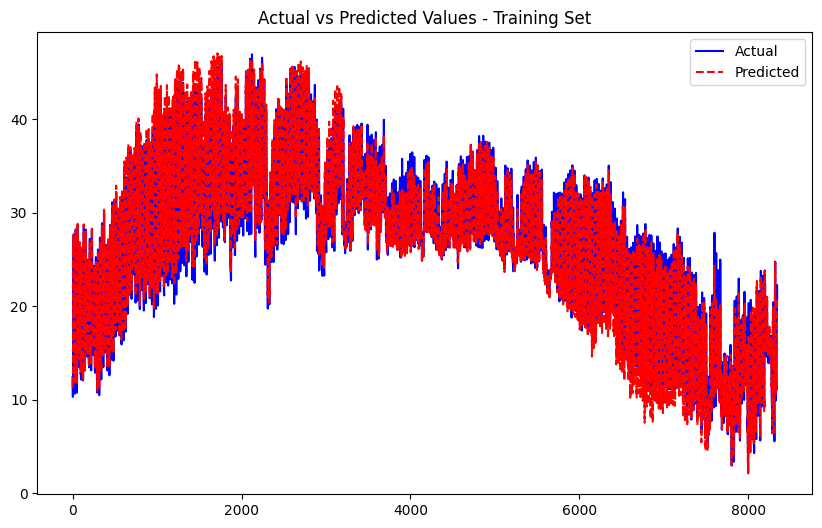

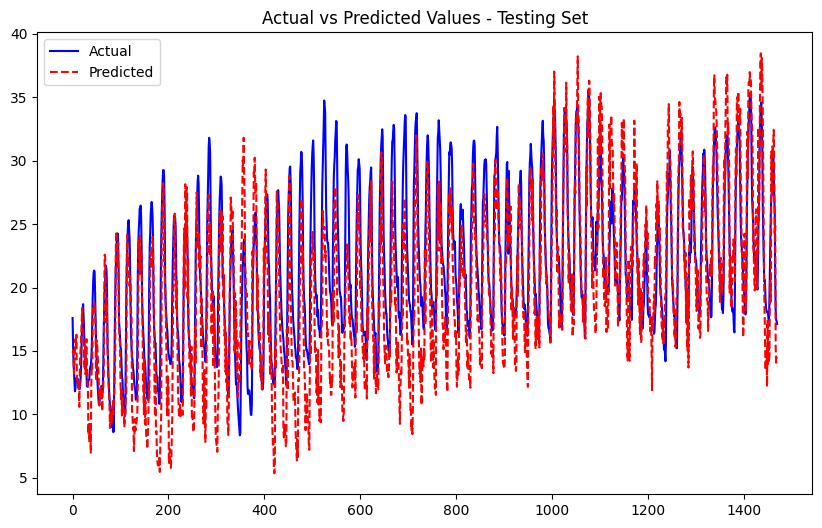

Processing node 35...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0542
Epoch [2/50], Train Loss: 0.0453
Epoch [3/50], Train Loss: 0.0406
Epoch [4/50], Train Loss: 0.0380
Epoch [5/50], Train Loss: 0.0357
Epoch [6/50], Train Loss: 0.0344
Epoch [7/50], Train Loss: 0.0336
Epoch [8/50], Train Loss: 0.0323
Epoch [9/50], Train Loss: 0.0316
Epoch [10/50], Train Loss: 0.0313
Epoch [11/50], Train Loss: 0.0304
Epoch [12/50], Train Loss: 0.0303
Epoch [13/50], Train Loss: 0.0298
Epoch [14/50], Train Loss: 0.0294
Epoch [15/50], Train Loss: 0.0292
Epoch [16/50], Train Loss: 0.0287
Epoch [17/50], Train Loss: 0.0291
Epoch [18/50], Train Loss: 0.0284
Epoch [19/50], Train Loss: 0.0282
Epoch [20/50], Train Loss: 0.0280
Epoch [21/50], Train Loss: 0.0281
Epoch [22/50], Train Loss: 0.0280
Epoch [23/50], Train Loss: 0.0279
Epoch [24/50], Train Loss: 0.0279
Epoch [25/50], Train Loss: 0.0274
Epoch [26/50], Train Loss: 0.0278
Epoch [27/50], Train Loss: 0.0275
Epoch [28/50], Train Loss: 0.0277
Epoch [29/50], Train Loss: 0.0275
Epoch [30/50], Train Lo

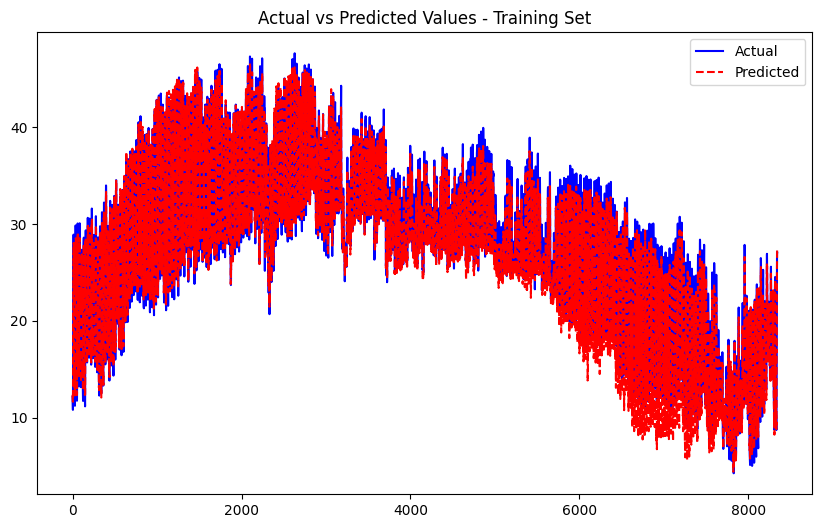

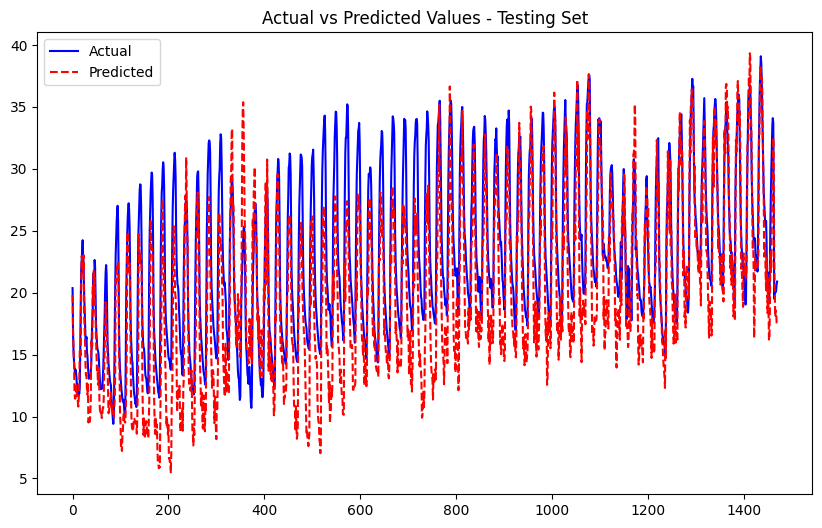

Processing node 36...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0577
Epoch [2/50], Train Loss: 0.0484
Epoch [3/50], Train Loss: 0.0434
Epoch [4/50], Train Loss: 0.0401
Epoch [5/50], Train Loss: 0.0379
Epoch [6/50], Train Loss: 0.0357
Epoch [7/50], Train Loss: 0.0340
Epoch [8/50], Train Loss: 0.0330
Epoch [9/50], Train Loss: 0.0321
Epoch [10/50], Train Loss: 0.0315
Epoch [11/50], Train Loss: 0.0311
Epoch [12/50], Train Loss: 0.0304
Epoch [13/50], Train Loss: 0.0299
Epoch [14/50], Train Loss: 0.0294
Epoch [15/50], Train Loss: 0.0293
Epoch [16/50], Train Loss: 0.0289
Epoch [17/50], Train Loss: 0.0289
Epoch [18/50], Train Loss: 0.0289
Epoch [19/50], Train Loss: 0.0285
Epoch [20/50], Train Loss: 0.0286
Epoch [21/50], Train Loss: 0.0282
Epoch [22/50], Train Loss: 0.0280
Epoch [23/50], Train Loss: 0.0280
Epoch [24/50], Train Loss: 0.0282
Epoch [25/50], Train Loss: 0.0275
Epoch [26/50], Train Loss: 0.0276
Epoch [27/50], Train Loss: 0.0276
Epoch [28/50], Train Loss: 0.0280
Epoch [29/50], Train Loss: 0.0274
Epoch [30/50], Train Lo

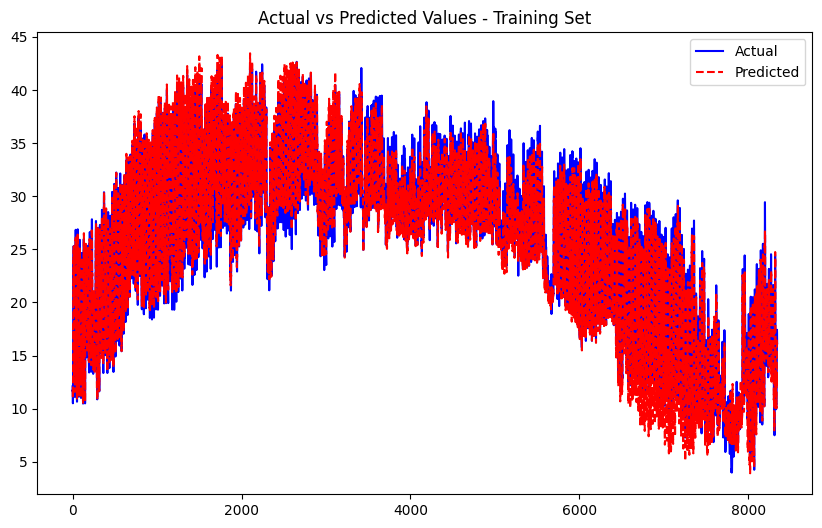

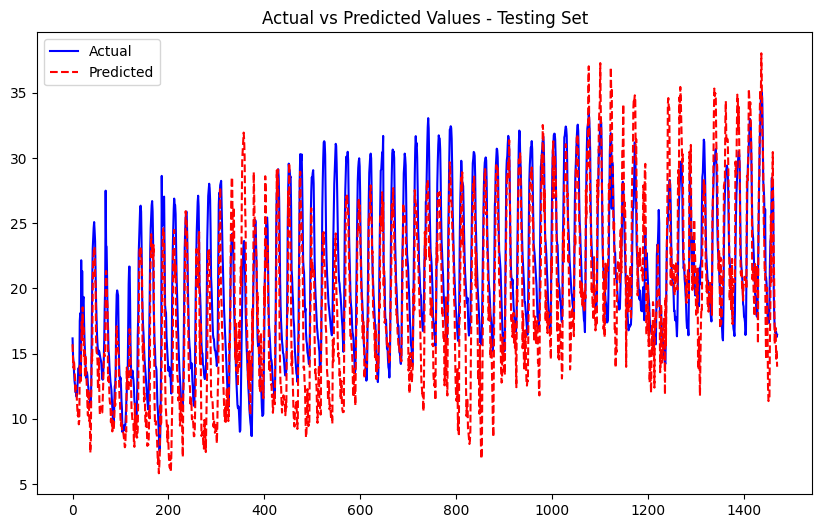

Processing node 37...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0581
Epoch [2/50], Train Loss: 0.0497
Epoch [3/50], Train Loss: 0.0445
Epoch [4/50], Train Loss: 0.0411
Epoch [5/50], Train Loss: 0.0392
Epoch [6/50], Train Loss: 0.0375
Epoch [7/50], Train Loss: 0.0356
Epoch [8/50], Train Loss: 0.0350
Epoch [9/50], Train Loss: 0.0338
Epoch [10/50], Train Loss: 0.0333
Epoch [11/50], Train Loss: 0.0324
Epoch [12/50], Train Loss: 0.0320
Epoch [13/50], Train Loss: 0.0315
Epoch [14/50], Train Loss: 0.0309
Epoch [15/50], Train Loss: 0.0314
Epoch [16/50], Train Loss: 0.0304
Epoch [17/50], Train Loss: 0.0306
Epoch [18/50], Train Loss: 0.0303
Epoch [19/50], Train Loss: 0.0303
Epoch [20/50], Train Loss: 0.0304
Epoch [21/50], Train Loss: 0.0298
Epoch [22/50], Train Loss: 0.0298
Epoch [23/50], Train Loss: 0.0300
Epoch [24/50], Train Loss: 0.0297
Epoch [25/50], Train Loss: 0.0296
Epoch [26/50], Train Loss: 0.0298
Epoch [27/50], Train Loss: 0.0294
Epoch [28/50], Train Loss: 0.0294
Epoch [29/50], Train Loss: 0.0292
Epoch [30/50], Train Lo

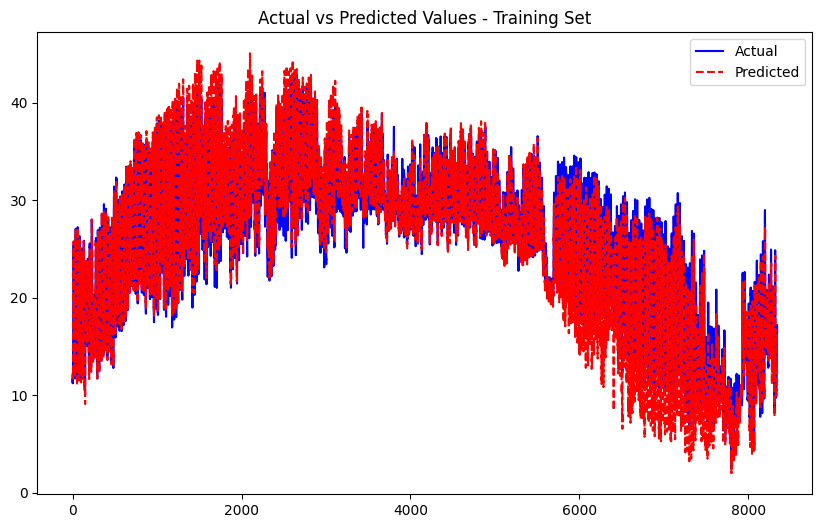

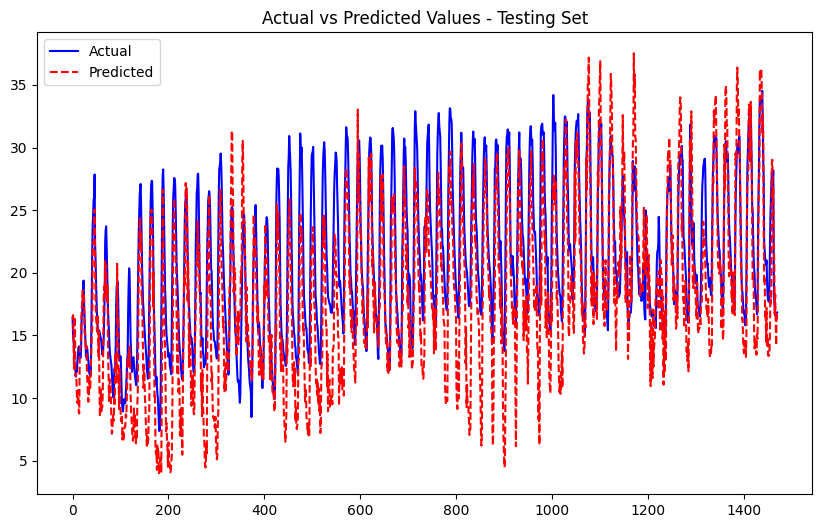

Processing node 38...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0577
Epoch [2/50], Train Loss: 0.0462
Epoch [3/50], Train Loss: 0.0401
Epoch [4/50], Train Loss: 0.0367
Epoch [5/50], Train Loss: 0.0342
Epoch [6/50], Train Loss: 0.0326
Epoch [7/50], Train Loss: 0.0308
Epoch [8/50], Train Loss: 0.0300
Epoch [9/50], Train Loss: 0.0289
Epoch [10/50], Train Loss: 0.0283
Epoch [11/50], Train Loss: 0.0281
Epoch [12/50], Train Loss: 0.0275
Epoch [13/50], Train Loss: 0.0273
Epoch [14/50], Train Loss: 0.0268
Epoch [15/50], Train Loss: 0.0264
Epoch [16/50], Train Loss: 0.0259
Epoch [17/50], Train Loss: 0.0261
Epoch [18/50], Train Loss: 0.0253
Epoch [19/50], Train Loss: 0.0253
Epoch [20/50], Train Loss: 0.0258
Epoch [21/50], Train Loss: 0.0254
Epoch [22/50], Train Loss: 0.0249
Epoch [23/50], Train Loss: 0.0254
Epoch [24/50], Train Loss: 0.0251
Epoch [25/50], Train Loss: 0.0246
Epoch [26/50], Train Loss: 0.0248
Epoch [27/50], Train Loss: 0.0247
Epoch [28/50], Train Loss: 0.0247
Epoch [29/50], Train Loss: 0.0243
Epoch [30/50], Train Lo

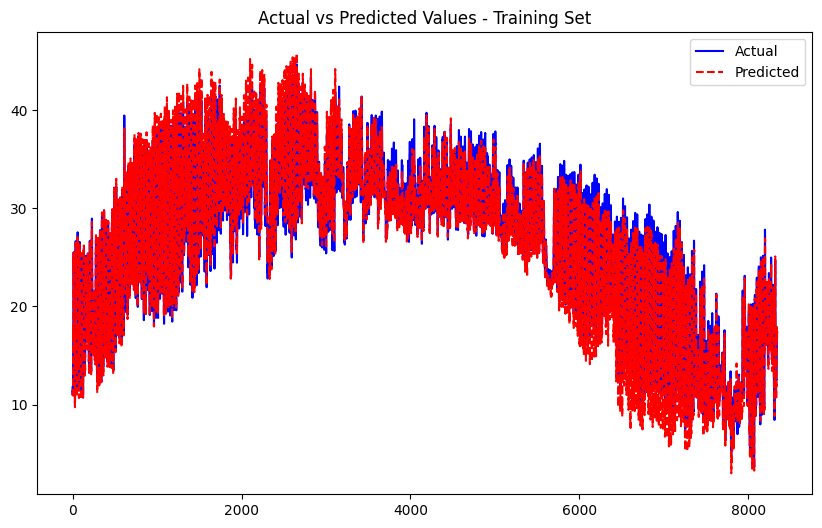

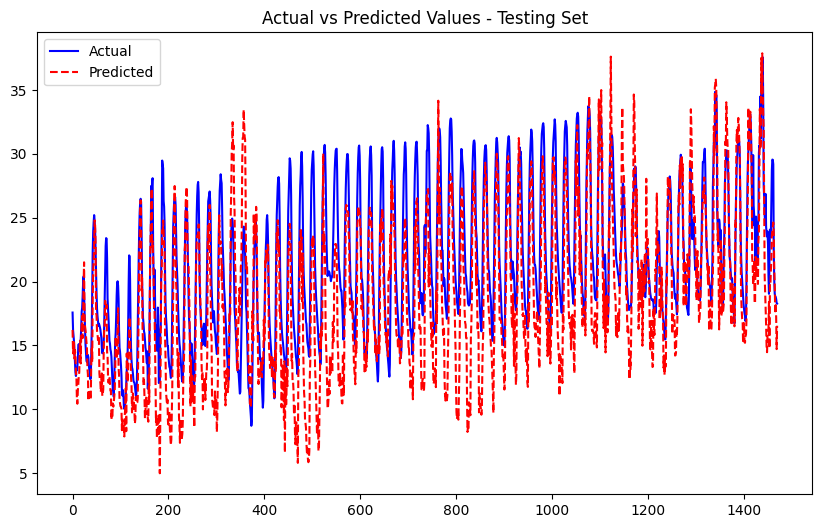

Processing node 39...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0987
Epoch [2/50], Train Loss: 0.0828
Epoch [3/50], Train Loss: 0.0739
Epoch [4/50], Train Loss: 0.0676
Epoch [5/50], Train Loss: 0.0631
Epoch [6/50], Train Loss: 0.0604
Epoch [7/50], Train Loss: 0.0571
Epoch [8/50], Train Loss: 0.0555
Epoch [9/50], Train Loss: 0.0535
Epoch [10/50], Train Loss: 0.0522
Epoch [11/50], Train Loss: 0.0513
Epoch [12/50], Train Loss: 0.0506
Epoch [13/50], Train Loss: 0.0495
Epoch [14/50], Train Loss: 0.0490
Epoch [15/50], Train Loss: 0.0484
Epoch [16/50], Train Loss: 0.0480
Epoch [17/50], Train Loss: 0.0479
Epoch [18/50], Train Loss: 0.0477
Epoch [19/50], Train Loss: 0.0470
Epoch [20/50], Train Loss: 0.0469
Epoch [21/50], Train Loss: 0.0466
Epoch [22/50], Train Loss: 0.0463
Epoch [23/50], Train Loss: 0.0463
Epoch [24/50], Train Loss: 0.0461
Epoch [25/50], Train Loss: 0.0455
Epoch [26/50], Train Loss: 0.0458
Epoch [27/50], Train Loss: 0.0453
Epoch [28/50], Train Loss: 0.0452
Epoch [29/50], Train Loss: 0.0452
Epoch [30/50], Train Lo

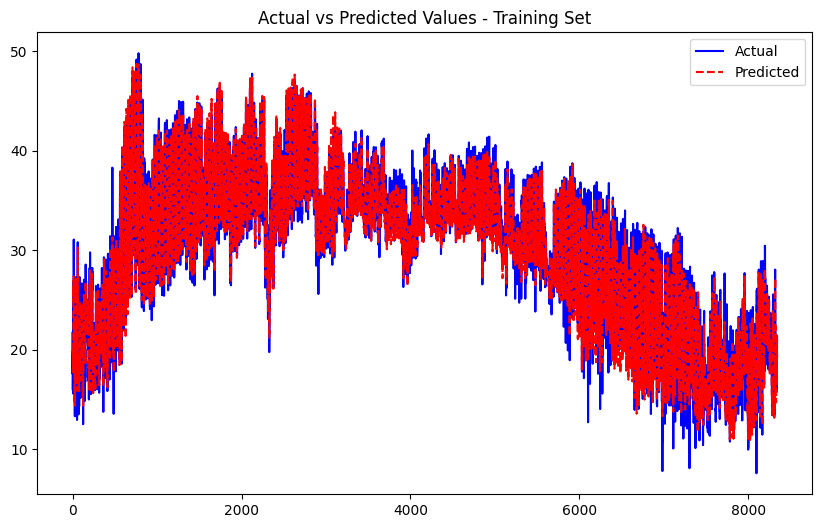

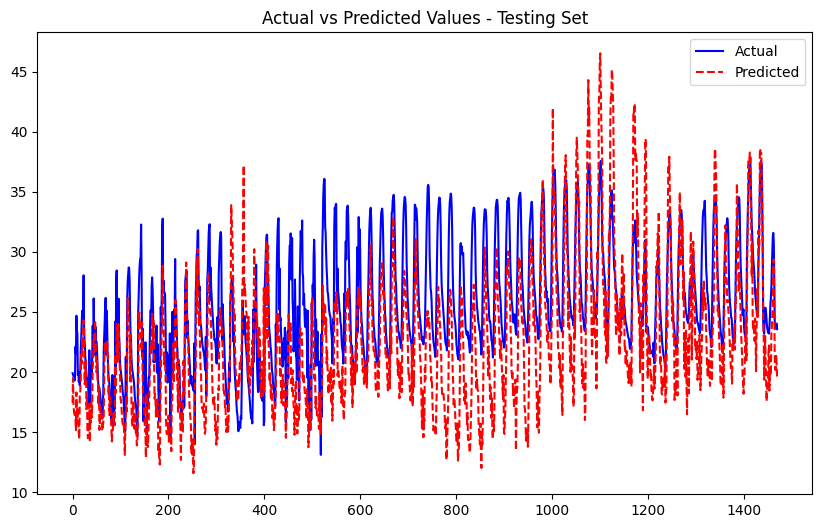

Processing node 40...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.2248
Epoch [2/50], Train Loss: 0.1662
Epoch [3/50], Train Loss: 0.1370
Epoch [4/50], Train Loss: 0.1111
Epoch [5/50], Train Loss: 0.0939
Epoch [6/50], Train Loss: 0.0782
Epoch [7/50], Train Loss: 0.0706
Epoch [8/50], Train Loss: 0.0667
Epoch [9/50], Train Loss: 0.0614
Epoch [10/50], Train Loss: 0.0569
Epoch [11/50], Train Loss: 0.0529
Epoch [12/50], Train Loss: 0.0524
Epoch [13/50], Train Loss: 0.0490
Epoch [14/50], Train Loss: 0.0479
Epoch [15/50], Train Loss: 0.0465
Epoch [16/50], Train Loss: 0.0468
Epoch [17/50], Train Loss: 0.0451
Epoch [18/50], Train Loss: 0.0450
Epoch [19/50], Train Loss: 0.0431
Epoch [20/50], Train Loss: 0.0429
Epoch [21/50], Train Loss: 0.0425
Epoch [22/50], Train Loss: 0.0414
Epoch [23/50], Train Loss: 0.0410
Epoch [24/50], Train Loss: 0.0401
Epoch [25/50], Train Loss: 0.0417
Epoch [26/50], Train Loss: 0.0404
Epoch [27/50], Train Loss: 0.0397
Epoch [28/50], Train Loss: 0.0393
Epoch [29/50], Train Loss: 0.0388
Epoch [30/50], Train Lo

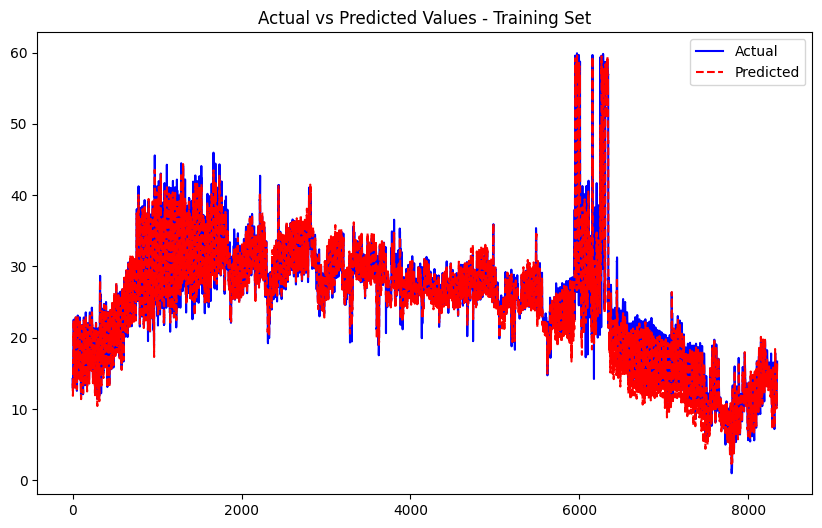

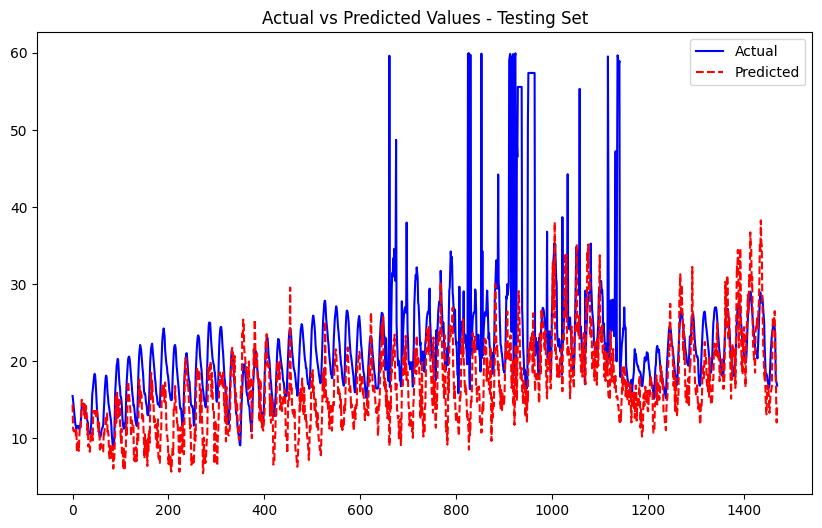

Processing node 41...


C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3])) that is different to the input size (torch.Size([3, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\Asus\AppData\Roaming\Python\Python311\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], Train Loss: 0.0760
Epoch [2/50], Train Loss: 0.0593
Epoch [3/50], Train Loss: 0.0519
Epoch [4/50], Train Loss: 0.0472
Epoch [5/50], Train Loss: 0.0449
Epoch [6/50], Train Loss: 0.0429
Epoch [7/50], Train Loss: 0.0402
Epoch [8/50], Train Loss: 0.0389
Epoch [9/50], Train Loss: 0.0386
Epoch [10/50], Train Loss: 0.0374
Epoch [11/50], Train Loss: 0.0365
Epoch [12/50], Train Loss: 0.0356
Epoch [13/50], Train Loss: 0.0353
Epoch [14/50], Train Loss: 0.0345
Epoch [15/50], Train Loss: 0.0340
Epoch [16/50], Train Loss: 0.0341
Epoch [17/50], Train Loss: 0.0334
Epoch [18/50], Train Loss: 0.0331
Epoch [19/50], Train Loss: 0.0331
Epoch [20/50], Train Loss: 0.0329
Epoch [21/50], Train Loss: 0.0326
Epoch [22/50], Train Loss: 0.0325
Epoch [23/50], Train Loss: 0.0321
Epoch [24/50], Train Loss: 0.0320
Epoch [25/50], Train Loss: 0.0320
Epoch [26/50], Train Loss: 0.0316
Epoch [27/50], Train Loss: 0.0311
Epoch [28/50], Train Loss: 0.0313
Epoch [29/50], Train Loss: 0.0311
Epoch [30/50], Train Lo

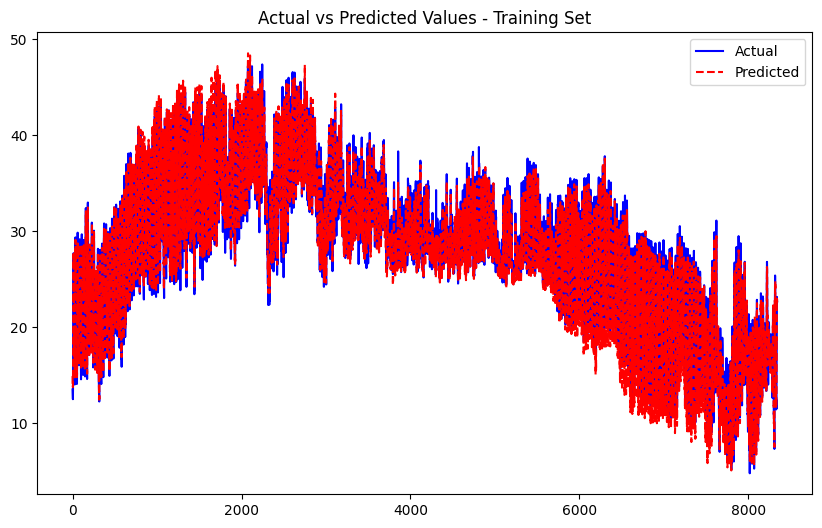

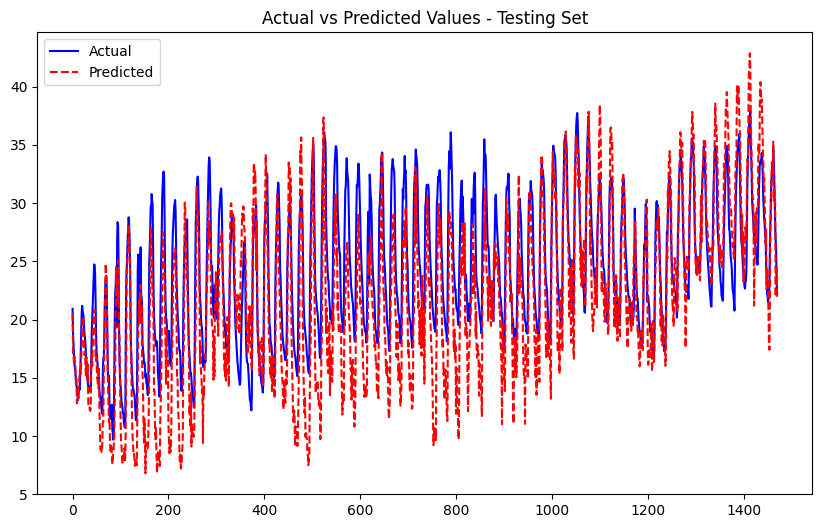

Train LSTM Imputed bs 3 sl 3.csv
CSV file 'Train LSTM Imputed bs 3 sl 3.csv' created successfully.
Test LSTM Imputed bs 3 sl 3.csv
CSV file 'Test LSTM Imputed bs 3 sl 3.csv' created successfully.


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import torch.optim.lr_scheduler as lr_scheduler

# Define the LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_prob=0.2):
        super(LSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        # Define the LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)  # One hidden layer
        
        # Dropout layer
        self.dropout = nn.Dropout(dropout_prob)
        
        # Fully connected layer (output layer)
        self.fc = nn.Linear(hidden_size, output_size)
        
        # Activation function
        self.elu = nn.ELU()

    def forward(self, x):
        # Initialize hidden state and cell state with zeros
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)  # 1 layer, batch_size, hidden_size
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)  # 1 layer, batch_size, hidden_size

        # Forward pass through LSTM
        out, _ = self.lstm(x, (h0, c0))  # LSTM returns all outputs (hidden states) and the final states
        
        # Apply ReLU activation function to the last time step output
        out = self.elu(out[:, -1, :])  # out[:, -1, :] -> output from the last time step
        
        # Apply dropout to the hidden layer's output
        out = self.dropout(out)
        
        # Pass the output through the fully connected layer
        out = self.fc(out)
        
        return out


def train_model(model, train_loader, criterion, optimizer, num_epochs):
    model.train()  # Set the model to training mode
    for epoch in range(num_epochs):
        running_loss = 0.0
        
        # Training phase
        for features, targets in train_loader:
            features, targets = features.to(device), targets.to(device)

            # Reshape input for LSTM (batch_size, sequence_length, num_features)
            # features should already be of shape (batch_size, sequence_length, num_features)
            
            # Forward pass
            outputs = model(features)  # LSTM will process the sequence data correctly
            loss = criterion(outputs, targets)  # Compute the loss

            # Backward and optimize
            optimizer.zero_grad()  # Clear previous gradients
            loss.backward()  # Backpropagate the loss
            optimizer.step()  # Update weights

            running_loss += loss.item()    

        # Print training loss after each epoch
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {running_loss/len(train_loader):.4f}')
    
    # Switch back to evaluation mode
    model.eval()



def test_model(model, train_loader, test_loader, node_idx):
    model.eval()
    all_actuals = []
    all_predictions = []
    
    # For tracking actuals and predictions for train and test sets separately
    train_actuals = []
    train_predictions = []
    
    test_actuals = []
    test_predictions = []

    
    with torch.no_grad():
        # Predict on training data
        for features, targets in train_loader:
            features, targets = features.to(device), targets.to(device)
            outputs = model(features)

            train_actuals.append(targets.cpu().numpy())
            train_predictions.append(outputs.cpu().numpy())

        # Predict on testing data
        for features, targets in test_loader:
            features, targets = features.to(device), targets.to(device)
            outputs = model(features)

            test_actuals.append(targets.cpu().numpy())
            test_predictions.append(outputs.cpu().numpy())
    
    # Concatenate all sets
    train_actuals = np.concatenate(train_actuals, axis=0)
    test_actuals = np.concatenate(test_actuals, axis=0)
    
    train_predictions = np.concatenate(train_predictions, axis=0)
    test_predictions = np.concatenate(test_predictions, axis=0)

    # Check shapes before proceeding
    print(f"Training actuals shape: {train_actuals.shape}, Predictions shape: {train_predictions.shape}")
    print(f"Testing actuals shape: {test_actuals.shape}, Predictions shape: {test_predictions.shape}")
    
    # Combine them for inverse scaling
    all_actuals = np.concatenate([train_actuals, test_actuals])
    all_predictions = np.concatenate([train_predictions, test_predictions])
    
    # Inverse scaling
    file_name = input_files[node_idx]
    
    if file_name in scalers:
        all_actuals = all_actuals.reshape(-1, 1)
        all_predictions = all_predictions.reshape(-1, 1)
        
        # Apply inverse scaling
        all_actuals_inverse = scalers[file_name].inverse_transform(all_actuals).flatten()
        all_predictions_inverse = scalers[file_name].inverse_transform(all_predictions).flatten()
    else:
        print(f"Scaler not found for {file_name}")
        return
    
    # Split them back into training and test sets
    train_size = len(train_actuals)
    test_size = len(test_actuals)
    
    train_actuals_inverse = all_actuals_inverse[:train_size]
    test_actuals_inverse = all_actuals_inverse[train_size:]
    
    train_predictions_inverse = all_predictions_inverse[:train_size]
    test_predictions_inverse = all_predictions_inverse[train_size:]

    # Verify split sizes
    print(f"Split Training actuals shape: {train_actuals_inverse.shape}, Predictions shape: {train_predictions_inverse.shape}")
    print(f"Split Testing actuals shape: {test_actuals_inverse.shape}, Predictions shape: {test_predictions_inverse.shape}")
    
    # Function to calculate and print metrics
    def calculate_metrics(actuals, predictions, set_name):
        mae = mean_absolute_error(actuals, predictions)
        mse = mean_squared_error(actuals, predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(actuals, predictions)
        corr_coeff = np.corrcoef(actuals.flatten(), predictions.flatten())[0, 1]
        
        # Print the metrics
        print(f"{set_name} Set Metrics:")
        print(f"Mean Absolute Error (MAE): {mae:.4f}")
        print(f"Mean Squared Error (MSE): {mse:.4f}")
        print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
        print(f"Pearson Correlation Coefficient: {corr_coeff:.4f}")
        print(f"R-squared (R²): {r2:.4f}")
        print("\n" + "-"*40 + "\n")

        if set_name == 'Training':
            train_mae_list.append(mae)
            train_mse_list.append(mse)
            train_rmse_list.append(rmse)
            train_r2_list.append(r2)
            train_corr_list.append(corr_coeff)

        elif set_name == 'Testing':
            test_mae_list.append(mae)
            test_mse_list.append(mse)
            test_rmse_list.append(rmse)
            test_r2_list.append(r2)
            test_corr_list.append(corr_coeff)        
    
    # Calculate and print metrics for each set
    print(f"\nCalculating metrics for Node {node_idx+1} - {file_name}")
    calculate_metrics(train_actuals_inverse, train_predictions_inverse, 'Training')
    calculate_metrics(test_actuals_inverse, test_predictions_inverse, 'Testing')

    print(f"\n\nCalculating Average Metrics for Training:")
    print(f"Mean MAE: {np.mean(train_mae_list):.4f}")
    print(f"Mean MSE: {np.mean(train_mse_list):.4f}")
    print(f"Mean RMSE: {np.mean(train_rmse_list):.4f}")
    print(f"Mean R²: {np.mean(train_r2_list):.4f}")
    print(f"Mean CorrCoeff: {np.mean(train_corr_list):.4f}")

    print(f"\n\nCalculating Average Metrics for Testing:")
    print(f"Mean MAE: {np.mean(test_mae_list):.4f}")
    print(f"Mean MSE: {np.mean(test_mse_list):.4f}")
    print(f"Mean RMSE: {np.mean(test_rmse_list):.4f}")
    print(f"Mean R²: {np.mean(test_r2_list):.4f}")
    print(f"Mean CorrCoeff: {np.mean(test_corr_list):.4f}")  
    
    # Function to plot actual vs predicted values
    def plot_results(actuals, predictions, set_name):
        plt.figure(figsize=(10, 6))
        plt.plot(actuals, label="Actual", color='blue')
        plt.plot(predictions, label="Predicted", color='red', linestyle='dashed')
        plt.title(f'Actual vs Predicted Values - {set_name} Set')
        plt.legend()
        plt.show()
    
    # Plot results for each set
    plot_results(train_actuals_inverse, train_predictions_inverse, 'Training')
    plot_results(test_actuals_inverse, test_predictions_inverse, 'Testing')


def create_dataloaders(features, targets, batch_size, sequence_length):
    # Convert DataFrame to NumPy arrays
    features_np = features.to_numpy()
    targets_np = targets.to_numpy()

    # Prepare sequences of data
    feature_sequences = []
    target_sequences = []

    # Create rolling windows of `sequence_length`
    for i in range(len(features_np) - sequence_length + 1):
        # Get sequence of features and corresponding target
        feature_sequences.append(features_np[i:i+sequence_length])
        target_sequences.append(targets_np[i+sequence_length-1])  # target is the last value of the sequence

    # Convert to NumPy arrays
    feature_sequences = np.array(feature_sequences)
    target_sequences = np.array(target_sequences)

    # Convert to PyTorch tensors
    features_tensor = torch.tensor(feature_sequences, dtype=torch.float32)
    targets_tensor = torch.tensor(target_sequences, dtype=torch.float32)

    # Create a dataset and dataloader
    dataset = torch.utils.data.TensorDataset(features_tensor, targets_tensor)
    return torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Initialize the PyTorch model, criterion, and optimizer
input_size = train_features_list[0].shape[1]
hidden_size = 128
num_layers = 2
output_size = 1
num_epochs = 50
learning_rate = 0.0005
batch_size = 3
sequence_length = 3

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LSTMModel(input_size, hidden_size, num_layers, output_size).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

print(f"For Batch Size= {batch_size} and Sequence Length = {sequence_length}")
train_mae_list = []
train_mse_list = []
train_rmse_list = []
train_r2_list = []
train_corr_list = []

test_mae_list = []
test_mse_list = []
test_rmse_list = []
test_r2_list = []
test_corr_list = []
# Process for each node
for node_idx, (train_features, train_targets, test_features, test_targets) in enumerate(zip(train_features_list, train_target_list, test_features_list, test_target_list)):
    print(f"Processing node {node_idx+1}...")

    # Create dataloaders
    train_loader = create_dataloaders(train_features, train_targets, batch_size, sequence_length)
    test_loader = create_dataloaders(test_features, test_targets, batch_size, sequence_length)

    # Train the model
    train_model(model, train_loader, criterion, optimizer, num_epochs)

    # Test the model and output metrics/plot
    test_model(model, train_loader, test_loader, node_idx)

    # Define function to create DataFrame and save to CSV
def create_metrics_csv(file_name, input_files, mae_list, mse_list, rmse_list, r2_list, corr_list):
    metrics_df = pd.DataFrame({
        "File Name": input_files,
        "MAE": mae_list,
        "MSE": mse_list,
        "RMSE": rmse_list,
        "R2": r2_list,
        "CorrCoeff": corr_list
    })
    metrics_df.to_csv(file_name, index=False)
    print(f"CSV file '{file_name}' created successfully.")

# Create CSV for training set
file_name = "Train LSTM Imputed bs 3 sl 3.csv"
print(file_name)
create_metrics_csv(file_name, input_files, train_mae_list, train_mse_list, train_rmse_list, train_r2_list, train_corr_list)

# Create CSV for test set
file_name = "Test LSTM Imputed bs 3 sl 3.csv"
print(file_name)
create_metrics_csv(file_name, input_files, test_mae_list, test_mse_list, test_rmse_list, test_r2_list, test_corr_list)    
